# OneK1K aging signature model

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os,sys
import numpy as np
import anndata
import pandas as pd
import mudata as md
import scanpy as sc
import glob
from tqdm import tqdm
import scipy
import pertpy
import yaml

import matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

from copy import deepcopy

import process as process
import plot as plot

mpl.rcParams['pdf.fonttype'] = 42  # Embed fonts as TrueType
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = ['Arial', 'Helvetica', 'DejaVu Sans']
plt.rcParams['figure.autolayout'] = True
plt.rcParams['figure.dpi'] = 300  # or 150, 200, etc.
plt.rcParams['savefig.dpi'] = 300

# Increase all font sizes
plt.rcParams['font.size'] = 16  # Base font size
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15
plt.rcParams['legend.fontsize'] = 15

sys.path.append('../3_DE_analysis')
from DE_analysis_utils import *

/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/utils.py:435: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/utils.py:435: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/utils.py:435: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/site-packages/anndata/utils.py:435: FutureWarning: Importing CSCDataset from `anndata.experimental` is deprecated. Import anndata.abc.CSCDataset instead.
  warnings.warn(msg, FutureWarning)
/home/emmadann/miniforge3/envs/rpy2-voodoo/lib/python3.12/

In [57]:
with open('../../metadata/figure_palettes.yaml', 'r') as f:
    palettes = yaml.safe_load(f)

palettes['pathways'] = {
    'mTORC1':'#00A650',
    'SUMO':'#D946EF'
}

In [33]:

def parse_gene_sets(filename):
   gene_sets = {}
   with open(filename, 'r') as f:
       for line in f:
           terms = line.strip().split('\t')
           gene_sets[terms[0]] = terms[2:]
   return gene_sets

OAKPATH = '/mnt/oak/'
KEGG_sets = parse_gene_sets(f'{OAKPATH}/users/emma/data//KEGG_2019_Human.txt')
GO_sets = parse_gene_sets(f'{OAKPATH}/users/emma/data/GO_Biological_Process_2023.txt')

## Load perturbation effects from perturb-seq

In [5]:
datadir = f'{OAKPATH}/users/emma/data/GWT/CD4i_final/'
experiment_name = 'CD4i_final'
adata_de = sc.read_h5ad(datadir + f'/DE_results_all_confounders/{experiment_name}.merged_DE_results.h5ad')

adata_de.layers['zscore'] = adata_de.layers['log_fc'] / adata_de.layers['lfcSE']
adata_de.layers['zscore'][np.where(adata_de.layers['zscore'] > 100)] = 100
for cond in adata_de.obs.culture_condition.unique():
    affected_gs_cond = np.sum(adata_de[adata_de.obs['culture_condition'] == cond].layers['adj_p_value'] < 0.1, axis=0)
    adata_de.var[f'n_signif_effects_{cond}'] = affected_gs_cond

adata_de.var_names = adata_de.var['gene_name'].values

# Filter very lowly expressed genes
base_mean_df = sc.get.obs_df(adata_de, adata_de.var_names.tolist() + ['culture_condition', 'chunk'], layer='baseMean')
base_mean_df = base_mean_df.drop_duplicates().sort_values('culture_condition')

# Calculate for Rest condition
base_mean_rest = base_mean_df[base_mean_df['culture_condition'] == 'Rest'].set_index('chunk').drop('culture_condition', axis=1).T
adata_de.var['mean_baseMean_Rest'] = base_mean_rest.mean(1).fillna(0)
adata_de.var['std_baseMean_Rest'] = base_mean_rest.std(1).fillna(10000)

# Calculate for Stim8hr condition
base_mean_stim8 = base_mean_df[base_mean_df['culture_condition'] == 'Stim8hr'].set_index('chunk').drop('culture_condition', axis=1).T
adata_de.var['mean_baseMean_Stim8hr'] = base_mean_stim8.mean(1).fillna(0)
adata_de.var['std_baseMean_Stim8hr'] = base_mean_stim8.std(1).fillna(10000)

# Calculate for Stim48hr condition
base_mean_stim48 = base_mean_df[base_mean_df['culture_condition'] == 'Stim48hr'].set_index('chunk').drop('culture_condition', axis=1).T
adata_de.var['mean_baseMean_Stim48hr'] = base_mean_stim48.mean(1).fillna(0)
adata_de.var['std_baseMean_Stim48hr'] = base_mean_stim48.std(1).fillna(10000)

# Exclude from analysis genes with very low base mean (messing up reliability estimate)
gs_mask = (adata_de.var['mean_baseMean_Rest'] > 0.1) & (adata_de.var['mean_baseMean_Stim8hr'] > 0.1) & (adata_de.var['mean_baseMean_Stim48hr'] > 0.1)
adata_de = adata_de[:, gs_mask].copy()
sum(~gs_mask)

3677

In [6]:
adata_de_corr = anndata.experimental.read_lazy(datadir + f'/DE_results_all_confounders/CD4i_final.merged_DE_results_corrected.h5ad')
target_contrast_correction_dict = dict(zip(adata_de_corr.obs.to_dataframe()['target_contrast'], adata_de_corr.obs.to_dataframe()['target_contrast_corrected']))
target_contrast_name_correction_dict = dict(zip(adata_de_corr.obs.to_dataframe()['target_contrast_gene_name'], adata_de_corr.obs.to_dataframe()['target_contrast_gene_name_corrected']))

adata_de.obs['target_contrast_gene_name'] = adata_de.obs['target_contrast_gene_name'].map(target_contrast_name_correction_dict)
adata_de.obs['target_contrast'] = adata_de.obs['target_contrast'].map(target_contrast_correction_dict)

# remove missing perturb
adata_de = adata_de[~adata_de.obs['target_contrast_gene_name'].isna()].copy()

# Load summary stats
DE_stats = pd.read_csv(datadir + f'/DE_results_all_confounders/DE_summary_stats_per_target_corrected.csv', index_col=0)

In [7]:
adata_de

AnnData object with n_obs × n_vars = 33983 × 10282
    obs: 'target_contrast_gene_name', 'culture_condition', 'target_contrast', 'chunk', 'n_cells_target'
    var: 'gene_ids', 'gene_name', 'n_signif_effects_Stim8hr', 'n_signif_effects_Stim48hr', 'n_signif_effects_Rest', 'mean_baseMean_Rest', 'std_baseMean_Rest', 'mean_baseMean_Stim8hr', 'std_baseMean_Stim8hr', 'mean_baseMean_Stim48hr', 'std_baseMean_Stim48hr'
    layers: 'adj_p_value', 'baseMean', 'lfcSE', 'log_fc', 'p_value', 'zscore'

K562 data as negative control

In [8]:
k562_adata_de = sc.read_h5ad('/mnt/oak/users/emma/data/GWT/K562_DE_analysis/K562.merged_DE_results.h5ad')

k562_adata_de.layers['zscore'] = k562_adata_de.layers['log_fc'] / k562_adata_de.layers['lfcSE']
k562_adata_de.layers['zscore'][np.where(k562_adata_de.layers['zscore'] > 50)] = 50
k562_adata_de

AnnData object with n_obs × n_vars = 3081 × 6294
    obs: 'culture_condition', 'target_contrast', 'chunk', 'target_contrast_gene_name', 'n_cells_target'
    layers: 'adj_p_value', 'baseMean', 'lfcSE', 'log_fc', 'p_value', 'zscore'

In [9]:
# OAKPATH = '/oak/stanford/groups/pritch/'
figdir = 'figures/'
resultsdir = 'results/'
h5ad_file = '/mnt/oak/users/emma/data/cxg_datasets/Yazar2022.h5ad'


### Read outputs from DE analysis

Run with `1k1k_analysis.py`

In [10]:
OAKPATH='/mnt/oak/'
datadir = f'{OAKPATH}/users/emma/data/GWT/OneK1K_analysis/'

# Define cell type classes
ct_classes = ['CD4T', 'CD8T', 'NK', 'B']

# Dictionary to store results for each cell type
train_signatures = {}
val_signatures = {}

# Load results for each cell type
for ct in ct_classes:
    pbulk_adata = sc.read_h5ad(datadir + f"Yazar2022_{ct}_processed.pbulk.h5ad")
    pbulk_adata.var_names.isin(adata_de.var.index).sum()
    # Read and process training data
    train_df = pd.read_csv(f'results/DE_age_cat_{ct}_train.csv', index_col=0)
    train_df = train_df[(train_df['baseMean'] > 0)]
    train_df = train_df.rename({'log2FoldChange':'log_fc', 'padj':'adj_p_value', 'ensembl_id':'variable'}, axis=1)
    if 'variable' not in train_df.columns:
        train_df['variable'] = train_df.index.values
    train_df['gene_name'] = pbulk_adata.var.loc[train_df.variable]['feature_name'].values
    train_df['perturbseq_gene'] = train_df['variable'].isin(adata_de.var.index)
    train_df['zscore'] = train_df['log_fc']/train_df['lfcSE']
    train_df['adj_p_value'] = train_df['adj_p_value'].fillna(1)
    train_df['adj_p_value'] = train_df['adj_p_value'].fillna(1)
    train_df = train_df.set_index('gene_name')
    train_signatures[ct] = train_df

    # Read and process validation data
    val_df = pd.read_csv(f'results/DE_age_cat_{ct}_validation.csv', index_col=0)
    val_df = val_df[(val_df['baseMean'] > 0)]
    val_df = val_df.rename({'log2FoldChange':'log_fc', 'padj':'adj_p_value', 'ensembl_id':'variable'}, axis=1)
    if 'variable' not in val_df.columns:
        val_df['variable'] = val_df.index.values
    val_df['gene_name'] = pbulk_adata.var.loc[val_df.variable]['feature_name'].values
    val_df['perturbseq_gene'] = val_df['variable'].isin(adata_de.var.index)
    val_df['zscore'] = val_df['log_fc']/val_df['lfcSE']
    val_df['adj_p_value'] = val_df['adj_p_value'].fillna(1)
    val_df = val_df.set_index('gene_name')
    val_signatures[ct] = val_df

## Train model on perturbation effetcs

In [11]:
from pert2state_model.Perturb2StateModel import Perturb2StateModel

In [12]:
def mask_cis_effects(X_perturbs):
    """Mask diagonal elements (cis effects) in perturbation matrix and impute with column means."""
    X_perturbs_masked = X_perturbs.copy()
    mask = pd.DataFrame(False, index=X_perturbs_masked.index, columns=X_perturbs_masked.columns)
    for idx in X_perturbs_masked.index:
        if idx in X_perturbs_masked.columns:
            mask.loc[idx, idx] = True
    X_perturbs_masked = X_perturbs_masked.mask(mask)
    # Impute masked values with column means
    X_perturbs_masked = X_perturbs_masked.fillna(X_perturbs_masked.mean())
    return X_perturbs_masked

def mask_low_zscore(X_perturbs, zscore_threshold=2.0):
    """Mask values below zscore threshold in perturbation matrix and impute with column means."""
    X_perturbs_masked = X_perturbs.copy()
    mask = pd.DataFrame(False, index=X_perturbs_masked.index, columns=X_perturbs_masked.columns)
    mask[abs(X_perturbs_masked) < zscore_threshold] = True
    X_perturbs_masked = X_perturbs_masked.mask(mask)
    # Impute masked values with column means
    X_perturbs_masked = X_perturbs_masked.fillna(X_perturbs_masked.mean())
    return X_perturbs_masked

def _train_model(input_adata_de, signature, perturb_layer, n_pcs, n_splits, n_repeats, model_id = 'model', scramble=False, mask_low=False, scale_y = False):
    """Train perturbation-to-state model from perturbseq DE results."""
    # Get target state values
    y_target = signature[perturb_layer].copy()
    if scale_y:
        y_target = (y_target - y_target.mean()) / y_target.std()

    # Get perturbseq responses 
    X_perturbs = sc.get.obs_df(input_adata_de, 
                                ['target_contrast_gene_name', 'culture_condition'] + list(input_adata_de.var_names), 
                                layer='zscore')
    X_perturbs = X_perturbs.set_index(X_perturbs['target_contrast_gene_name'].astype(str) + '_' + X_perturbs['culture_condition'].astype(str)).drop(['target_contrast_gene_name', 'culture_condition'], axis=1).T
    print(f"Perturbation matrix shape: {X_perturbs.shape}")
    # Assert that y_target and X_perturbs have matching indices
    assert all(y_target.index == X_perturbs.index), "Target state and perturbation matrix indices do not match"
    
    # Mask effect on target gene
    X_perturbs_masked = mask_cis_effects(X_perturbs)

    if mask_low:
        X_perturbs_masked = mask_low_zscore(X_perturbs_masked, zscore_threshold=3)

    if scramble:  
        print(f"Scrambling input")
        X_perturbs_masked = X_perturbs_masked.apply(lambda row: np.random.permutation(row.values), axis=1, result_type='broadcast')
        
    # Train model on CD4 cells
    print(f"Training model with {n_pcs} PCs, {n_splits} splits, {n_repeats} repeats")
    p2t_model = Perturb2StateModel(pca_transform=True, n_pcs=n_pcs, n_splits=n_splits, n_repeats=n_repeats, positive=False)
    p2t_model.fit(X_perturbs_masked, y_target, model_id=f'{model_id}')
    return(p2t_model, X_perturbs_masked, y_target)

In [13]:
# def eval_splits_on_repl(model, X_perturbs, y_target, y_target_repl, state_name=None, test_size_sample = None):
#     """
#     Calculate correlations between predictions and true values for each split of a model.
    
#     Parameters
#     ----------
#     model : object
#         Model object with get_prediction() and split_ixs attributes
#     y_target : pd.Series
#         Target values used for training
#     y_target_repl : pd.Series
#         Replicate target values to compare against
#     state_name : str, optional
#         Name of the state to include in output dataframe
        
#     Returns
#     -------
#     pd.DataFrame
#         DataFrame containing correlation metrics for each split
#     """
#     # Get predictions for each split
#     splits_pred = model.get_prediction(X_perturbs, return_splits=True)
    
#     # Get test indices for each split
#     test_indices = [x[1] for x in model.split_ixs]
#     if test_size_sample is not None:
#         # Sample a subset of test indices of specified size (to make results more comparable across models)
#         test_indices = [np.random.choice(test_idx, size=test_size_sample, replace=False) for test_idx in test_indices]
    
#     # Compare predictions to true values for each test split
#     all_split_corrs = None
#     for i, test_idx in enumerate(test_indices):
#         # Get predictions for this split from the corresponding column
#         test_pred = splits_pred.iloc[test_idx, i]
#         test_true = y_target_repl.iloc[test_idx]
#         test_input = y_target.iloc[test_idx]
        
#         # Calculate correlation for this split
#         corr = np.corrcoef(test_pred, test_true)[0,1]
#         top_corr = np.corrcoef(test_input, test_true)[0,1]
        
#         # Store correlation in dataframe
#         split_corr_df = pd.DataFrame({
#             'split': i,
#             'correlation': corr,
#             'upper_correlation': top_corr,
#             'state': state_name
#         }, index=[0])
        
#         if all_split_corrs is None:
#             all_split_corrs = split_corr_df
#         else:
#             all_split_corrs = pd.concat([all_split_corrs, split_corr_df])
            
#     return all_split_corrs

### Reconstruction performance

Sample common genes for comparison

In [43]:
comparisons = [
    'CD4T_Rest',
    'CD4T_Stim8hr',
    'CD4T_Stim48hr',
    'CD4T_K562'
    # 'CD8T_Rest',
    # 'CD8T_Stim8hr',
    # 'CD8T_Stim48hr',
    # 'NK_Rest',
    # 'NK_Stim8hr',
    # 'NK_Stim48hr',
]

comparison_data = {}

for comp in comparisons:
    s = comp.split('_')[0] 
    c = comp.split('_')[1]

    signature = train_signatures[s].copy()
    signature_replication = val_signatures[s].copy()
    
    # Define genes to test
    y_genes = signature.index.tolist()
    y_repl_genes = signature_replication.index.tolist()
    if c != 'K562':
        x_genes = adata_de.var_names.tolist()
    else:
        x_genes = k562_adata_de.var_names.tolist()
    common_gs = np.intersect1d(np.intersect1d(y_genes, y_repl_genes), x_genes)

    # Define regulators to test
    if c != 'K562':
        keep_targets = DE_stats[(DE_stats.n_total_de_genes >= 10) & (DE_stats.condition == c)].target_name.unique().tolist()
        a = adata_de[(adata_de.obs['culture_condition'] == c) & (adata_de.obs['target_contrast_gene_name'].isin(keep_targets))][:, common_gs].copy()
    else:
        # K562 as control
        k562_DE_stats = get_de_stats(k562_adata_de, effect_col='log_fc', signif_col='adj_p_value')
        keep_targets_K562 = k562_DE_stats.target_name.unique()
        a = k562_adata_de[k562_adata_de.obs['target_contrast_gene_name'].isin(keep_targets_K562)][:, common_gs].copy()

    comp_data = (signature.loc[common_gs], a)
    comparison_data[comp] = comp_data

In [44]:
%%time
np.random.seed(214)
comparison_results = {}

for comp_key in comparison_data.keys():
    signature, input_adata_de = comparison_data[comp_key]
    p2t_model, X_perturbs, y_target = _train_model(
        input_adata_de = input_adata_de,
        signature = signature,
        perturb_layer = 'zscore',
        n_pcs = 60,
        n_splits = 5,
        n_repeats = 1,
        scale_y = True
    )
    comparison_results[comp_key] = p2t_model, X_perturbs, y_target


Perturbation matrix shape: (6014, 2492)
Training model with 60 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (6014, 2672)
Training model with 60 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (6014, 2518)
Training model with 60 PCs, 5 splits, 1 repeats
Perturbation matrix shape: (3465, 3081)
Training model with 60 PCs, 5 splits, 1 repeats
CPU times: user 13min 26s, sys: 14min 24s, total: 27min 50s
Wall time: 37.1 s


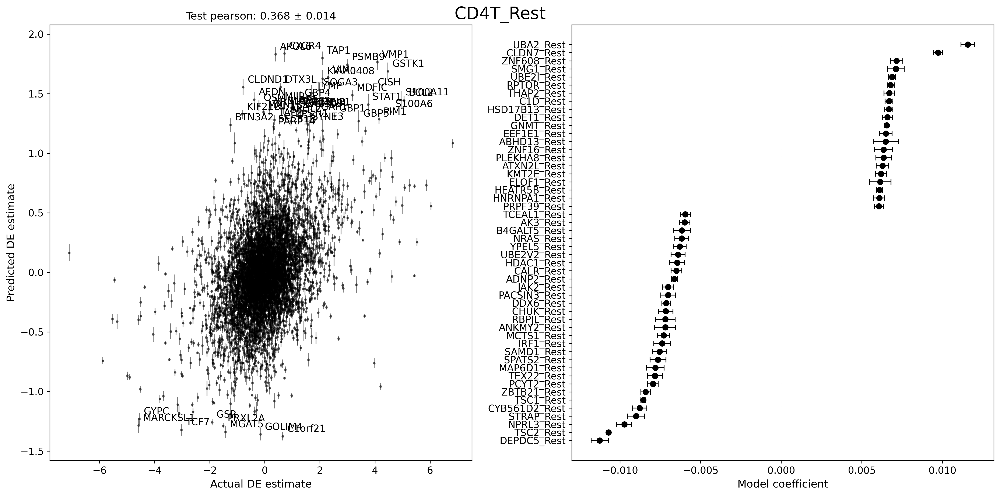

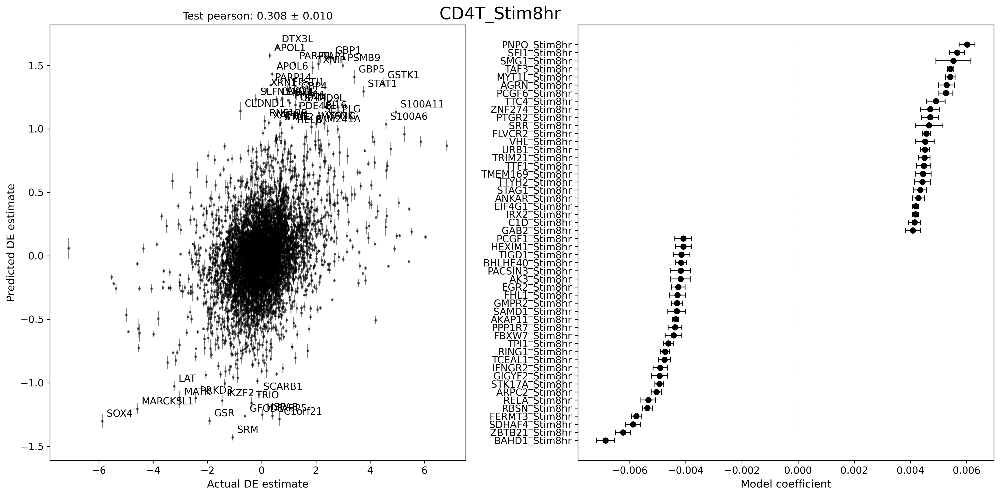

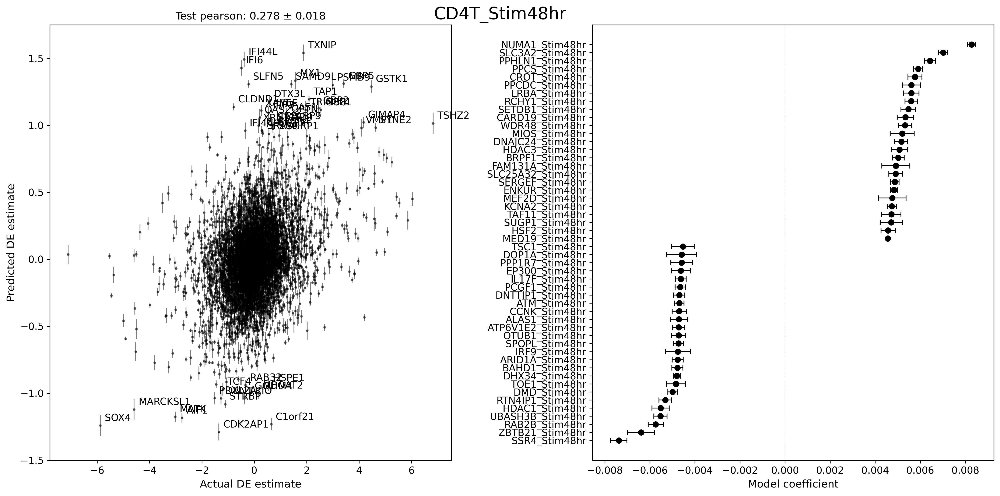

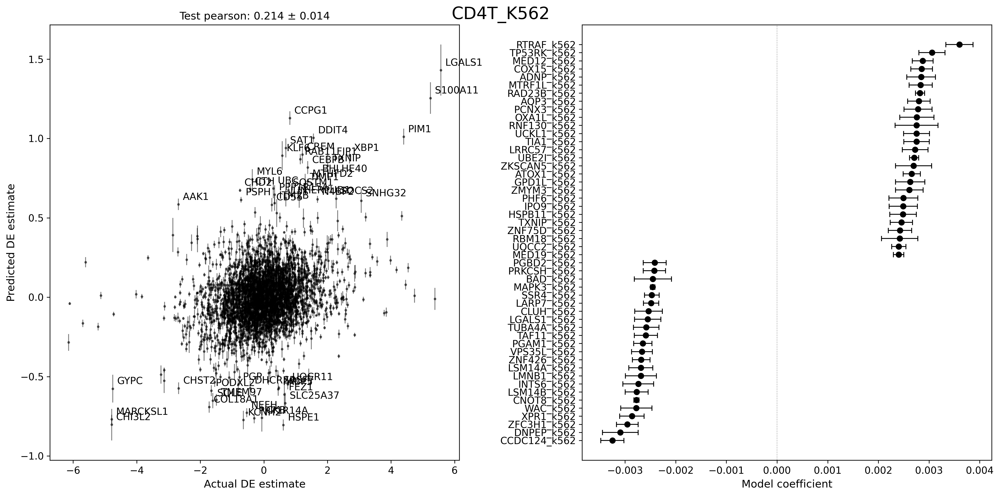

In [45]:
for dataset_key in comparison_results.keys():
    p2t_model, X_perturbs, y_target = comparison_results[dataset_key]
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    p2t_model.plot_prediction(X_perturbs, y_target, plot_metric='pearson', ax=axes[0], annotate_top_n=50)
    p2t_model.plot_coefs(top_n=50, ax=axes[1])
    fig.tight_layout()
    fig.suptitle(dataset_key)
    fig.show()

In [46]:
# Save comparison results dictionary
import pickle

with open('./results/aging_prediction_condition_comparison.models.pkl', 'wb') as f:
    pickle.dump(comparison_results, f)

In [18]:
import pickle

with open('./results/aging_prediction_condition_comparison.models.pkl', 'rb') as f:
    comparison_results = pickle.load(f)

In [47]:
comparison_results.keys()

dict_keys(['CD4T_Rest', 'CD4T_Stim8hr', 'CD4T_Stim48hr', 'CD4T_K562'])

In [48]:
# Get effect of aging in replication dataset
all_split_corrs = pd.DataFrame()
for dataset_key in comparison_results.keys():
    s = dataset_key.split("_")[0]
    y_target_replication = val_signatures[s]['zscore'].copy()
    p2t_model, X_perturbs, y_target = comparison_results[dataset_key]
    # Get predictions for each train-test split
    splits_pred = p2t_model.get_prediction(X_perturbs, return_splits=True)
    test_indices = [x[1] for x in p2t_model.split_ixs]
    
    # Compare predictions to true values for each test split
    for i, test_idx in enumerate(test_indices):
        # Get predictions for this split from the corresponding column
        test_pred = splits_pred.iloc[test_idx, i]
        test_input = y_target.iloc[test_idx]
        test_true = y_target_replication.loc[test_input.index]
        
        # Calculate correlations for this split
        corr = np.corrcoef(test_pred, test_true)[0,1]
        top_corr = np.corrcoef(test_input, test_true)[0,1]
        pred_input_corr = np.corrcoef(test_pred, test_input)[0,1]
        
        # Store correlation in dataframe
        split_corr_df = pd.DataFrame({
            'split': i,
            'correlation': corr,
            'upper_correlation': top_corr,
            'pred_input_correlation': pred_input_corr,
            'dataset_key': dataset_key
        }, index=[0])
        
        all_split_corrs = pd.concat([all_split_corrs, split_corr_df])
            

In [49]:
all_split_corrs

,split,correlation,upper_correlation,pred_input_correlation,dataset_key
0,0,0.241177,0.495204,0.387953,CD4T_Rest
0,1,0.252629,0.488522,0.396542,CD4T_Rest
0,2,0.228254,0.486055,0.357419,CD4T_Rest
0,3,0.199542,0.486388,0.370069,CD4T_Rest
0,4,0.215746,0.566142,0.321928,CD4T_Rest
0,0,0.153220,0.495204,0.328488,CD4T_Stim8hr
0,1,0.142256,0.488522,0.294267,CD4T_Stim8hr
0,2,0.125023,0.486055,0.311889,CD4T_Stim8hr
0,3,0.099657,0.486388,0.331090,CD4T_Stim8hr
0,4,0.145293,0.566142,0.281877,CD4T_Stim8hr


/tmp/ipykernel_200385/2843238499.py:18: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_200385/2843238499.py:18: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.pointplot(
/tmp/ipykernel_200385/2843238499.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[0].set_xticklabels(axs[0].get_xticklabels(), rotation=45)
/tmp/ipykernel_200385/2843238499.py:37: UserWarning: 

The `scale` parameter is deprecated and will be removed in v0.15.0. You can now control the size of each plot element using matplotlib `Line2D` parameters (e.g., `linewidth`, `markersize`, etc.).

  sns.pointplot(
/tmp/ipykernel_200385/2843

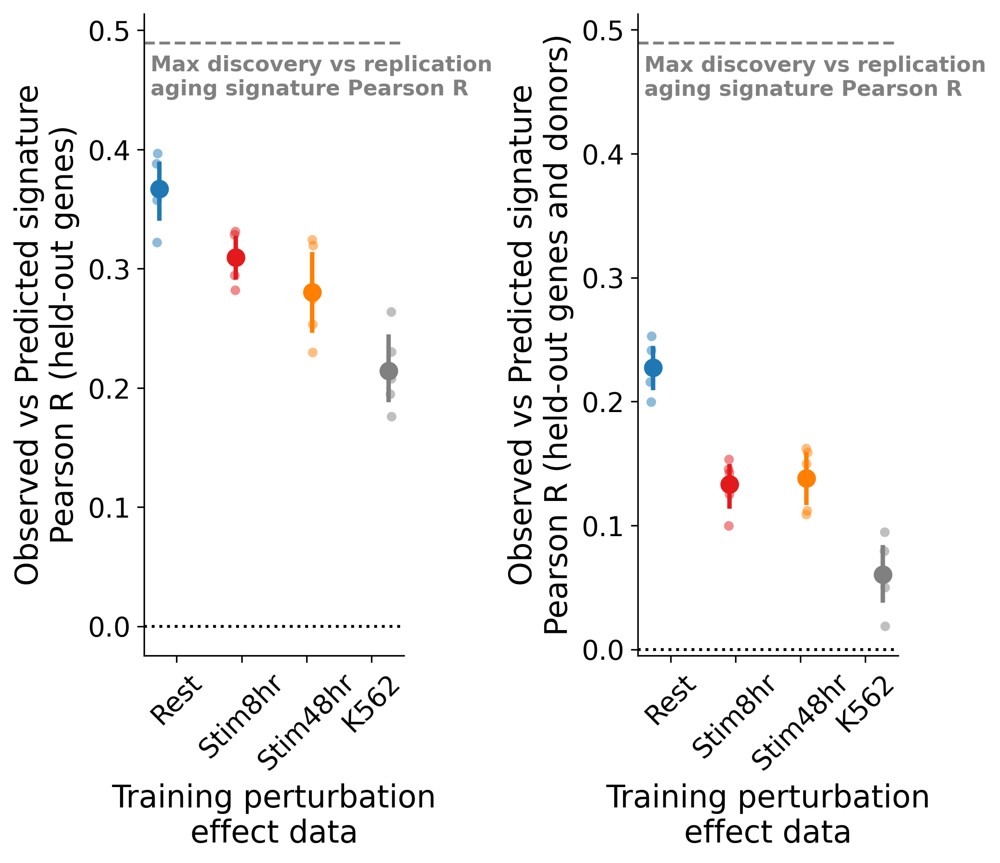

In [50]:
results_df = all_split_corrs.copy()
results_df['state'] = results_df['dataset_key'].str.split('_').str[1]
results_df['cell_type_class'] = results_df['dataset_key'].str.split('_').str[0]
results_df = results_df[results_df['cell_type_class'] == 'CD4T']
results_df['correlation_delta'] = results_df['correlation'] / results_df['upper_correlation']

fig, axs = plt.subplots(1, 2, figsize=(7,6), gridspec_kw={'wspace':0.9})

palettes['culture_condition'] = {**palettes['culture_condition'], 'K562':'grey'}

# Strip/pointplot for pred_input_correlation (training)
sns.stripplot(
    data=results_df.fillna(0), x='state', y='pred_input_correlation', 
    order=['Rest', 'Stim8hr', 'Stim48hr', 'K562'], 
    hue='state', palette=palettes['culture_condition'],
    ax=axs[0], size=5, jitter=0.05, alpha=0.5, dodge=True
)
sns.pointplot(
    data=results_df.fillna(0), x='state', y='pred_input_correlation',
    order=['Rest', 'Stim8hr', 'Stim48hr', 'K562'], 
    palette=palettes['culture_condition'], hue='state',
    dodge=0.532, join=False, ax=axs[0], scale=1.3, errwidth=2.3, markers='o'
)
axs[0].set_xlabel('Training perturbation\neffect data', fontsize=16)
axs[0].set_ylabel('Observed vs Predicted signature\nPearson R (held-out genes)', fontsize=16)
axs[0].tick_params(axis='both', labelsize=14)
axs[0].axhline(y=0, color='black', linestyle=':')
axs[0].set_xticklabels(axs[0].get_xticklabels(), rotation=45)

# Strip/pointplot for correlation (validation)
sns.stripplot(
    data=results_df.fillna(0), x='state', y='correlation', 
    order=['Rest', 'Stim8hr', 'Stim48hr', 'K562'], 
    hue='state', palette=palettes['culture_condition'],
    ax=axs[1], size=5, jitter=0.05, alpha=0.5, dodge=True
)
sns.pointplot(
    data=results_df.fillna(0), x='state', y='correlation',
    order=['Rest', 'Stim8hr', 'Stim48hr', 'K562'], 
    palette=palettes['culture_condition'], hue='state',
    dodge=0.532, join=False, ax=axs[1], scale=1.3, errwidth=2.3, markers='o'
)
axs[1].set_xlabel('Training perturbation\neffect data', fontsize=16)
axs[1].set_ylabel('Observed vs Predicted signature\nPearson R (held-out genes and donors)', fontsize=16)
axs[1].tick_params(axis='both', labelsize=14)
axs[1].set_xticklabels(axs[1].get_xticklabels(), rotation=45)
# Add horizontal line for mean upper correlation bound
axs[1].axhline(y=results_df['upper_correlation'].mean(), color='gray', linestyle='--')
axs[1].axhline(y=0, color='black', linestyle=':')
axs[1].text(axs[1].get_xlim()[0]+0.1, results_df['upper_correlation'].mean()-0.01,
    'Max discovery vs replication\naging signature Pearson R',
    color='gray',
    horizontalalignment='left', verticalalignment='top',
    fontsize=11,
    weight='bold')

# Add horizontal line for mean upper correlation bound
axs[0].axhline(y=results_df['upper_correlation'].mean(), color='gray', linestyle='--')
axs[0].text(axs[0].get_xlim()[0]+0.1, results_df['upper_correlation'].mean()-0.01,
    'Max discovery vs replication\naging signature Pearson R',
    color='gray',
    horizontalalignment='left', verticalalignment='top',
    fontsize=11,
    weight='bold')

# Adjust legend
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=14, frameon=False, title='Culture condition', title_fontsize=16)
sns.despine()
plt.tight_layout()
plt.savefig('./results/agingCD4T_prediction_conditions.barplot.png');
plt.savefig('./results/agingCD4T_prediction_conditions.barplot.pdf');


In [23]:
# results_df = all_split_corrs.copy()
# results_df['state'] = results_df['dataset_key'].str.split('_').str[1]
# results_df['cell_type_class'] = results_df['dataset_key'].str.split('_').str[0]
# results_df['correlation_delta'] = results_df['correlation'] / results_df['upper_correlation']

# fig, ax = plt.subplots(figsize=(10,6))

# # Create barplot
# sns.barplot(data=results_df.fillna(0), y='correlation', x='cell_type_class', hue='state',
#             ax=ax, palette=palettes['culture_condition'],
#             hue_order=['Rest', 'Stim8hr', 'Stim48hr'])


# # Add dotted lines for upper correlation values
# for cell_type in results_df.cell_type_class.unique():
#     cell_type_data = results_df[results_df.cell_type_class == cell_type]
#     for i, state in enumerate(['Rest', 'Stim8hr', 'Stim48hr']):
#         state_data = cell_type_data[cell_type_data.state == state]
#         if not state_data.empty:
#             x_pos = ax.get_xticks()[list(results_df.cell_type_class.unique()).index(cell_type)]
#             # Adjust x position based on hue position
#             width = 0.8 / 3  # Approximate width of each hue bar
#             x_adj = x_pos - width + (i * width)
#             upper_corr = state_data.upper_correlation.mean()
#             ax.hlines(y=upper_corr, xmin=x_adj-width/2, xmax=x_adj+width/2, 
#                      colors='black', linestyles='dotted', linewidth=2)

# # Customize fonts and labels
# plt.xlabel('OneK1K Cell Type', fontsize=16)
# plt.ylabel('True vs predicted aging signature correlation\n(held-out genes and donors)', fontsize=16) 
# ax.tick_params(axis='both', labelsize=14)

# # Adjust legend
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=14, frameon=False, title='Culture condition', title_fontsize=16)
# plt.tight_layout()


In [24]:
dataset_key = 'CD4T_Rest'
model, X, y_train = comparison_results[dataset_key]
s = dataset_key.split('_')[0] 
c = dataset_key.split('_')[1]
signature = train_signatures[s].copy()
signature_replication = val_signatures[s].copy()

split_id = 1
annotate_top_n = 0
plot_metric = 'pearson'

# Plot single split with train/test colored differently
train_ixs, test_ixs = model.split_ixs[split_id]
split_predictions = model.get_prediction(X, return_splits=True).iloc[:, split_id].reset_index()

# Add train/test annotation column
split_predictions['set_type'] = 'test'
split_predictions.loc[train_ixs, 'set_type'] = 'train'
split_predictions = split_predictions.set_index('index')

# Plot only genes measured in replication dataset
y = signature_replication['zscore'].copy()
common_indices = split_predictions.index.intersection(y.index)
y = y.loc[common_indices]
y_train = y_train.loc[common_indices]
split_predictions = split_predictions.loc[common_indices]

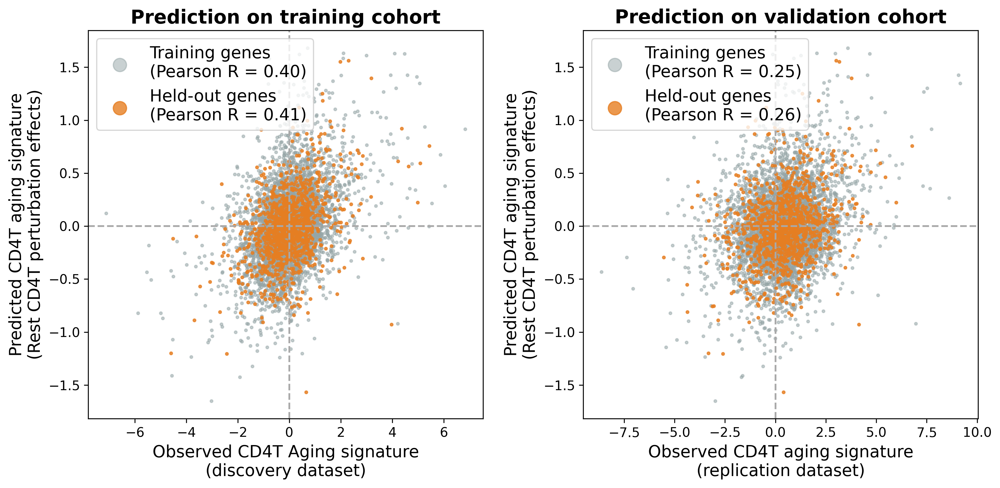

In [51]:
ylabel_str = 'Predicted CD4T aging signature\n(Rest CD4T perturbation effects)'

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

train_mask = split_predictions['set_type'] == 'train'
test_mask = split_predictions['set_type'] == 'test'

if plot_metric is not None:    
    # Compute metrics for y_train correlations
    metric_val_train_test, _ = scipy.stats.pearsonr(y_train[test_mask], split_predictions.loc[test_mask, 0])
    test_genes_label_1 = f"Held-out genes\n(Pearson R = {metric_val_train_test:.2f})"

    metric_val_train_train, _ = scipy.stats.pearsonr(y_train[train_mask], split_predictions.loc[train_mask, 0])
    train_genes_label_1 = f"Training genes\n(Pearson R = {metric_val_train_train:.2f})"

    # Compute metrics for y correlations
    metric_val_y_test, _ = scipy.stats.pearsonr(y[test_mask], split_predictions.loc[test_mask, 0])
    test_genes_label_2 = f"Held-out genes\n(Pearson R = {metric_val_y_test:.2f})"

    metric_val_y_train, _ = scipy.stats.pearsonr(y[train_mask], split_predictions.loc[train_mask, 0])
    train_genes_label_2 = f"Training genes\n(Pearson R = {metric_val_y_train:.2f})"

# First subplot - compare with training values
ax1.scatter(
    y_train[train_mask],
    split_predictions.loc[train_mask, 0],
    s=5,
    alpha=0.5,
    color=palettes['train_test']['train'],
    label=train_genes_label_1,
    rasterized=True
)

ax1.scatter(
    y_train[test_mask],
    split_predictions.loc[test_mask, 0], 
    s=5,
    alpha=0.8,
    color=palettes['train_test']['test'],
    label=test_genes_label_1,
    rasterized=True
)

ax1.set_ylabel(ylabel_str, fontsize=14)
ax1.set_xlabel('Observed CD4T Aging signature\n(discovery dataset)', fontsize=14)
ax1.tick_params(axis="both", labelsize=11)
ax1.axhline(y=0, color='darkgrey', linestyle='--')
ax1.axvline(x=0, color='darkgrey', linestyle='--')
ax1.legend(fontsize=14, loc='upper left', markerscale=5)

# Second subplot - compare with replication values
ax2.scatter(
    y[train_mask],
    split_predictions.loc[train_mask, 0],
    s=5, 
    alpha=0.5,
    color=palettes['train_test']['train'],
    label=train_genes_label_2
)

ax2.scatter(
    y[test_mask],
    split_predictions.loc[test_mask, 0],
    s=5,
    alpha=0.8, 
    color=palettes['train_test']['test'],
    label=test_genes_label_2
)

ax2.set_ylabel(ylabel_str, fontsize=14)
ax2.set_xlabel('Observed CD4T aging signature\n(replication dataset)', fontsize=14)
ax2.tick_params(axis="both", labelsize=11)
ax2.axhline(y=0, color='darkgrey', linestyle='--')
ax2.axvline(x=0, color='darkgrey', linestyle='--')
ax2.legend(fontsize=14, loc='upper left', markerscale=5)

if annotate_top_n > 0:
    # Get indices of top and bottom n values
    sorted_idx = y.abs().sort_values(ascending=False).index
    top_idx = sorted_idx[:annotate_top_n]

    # Add annotations to both plots
    for idx in top_idx:
        ax1.annotate(idx, (y_train[idx], split_predictions.loc[idx, 0]), xytext=(2, 2), textcoords="offset points", weight='bold', fontsize=16, color='white')
        ax1.annotate(idx, (y_train[idx], split_predictions.loc[idx, 0]), xytext=(2, 2), textcoords="offset points", fontsize=14)
        
        ax2.annotate(idx, (y[idx], split_predictions.loc[idx, 0]), xytext=(2, 2), textcoords="offset points", weight='bold', fontsize=16, color='white')
        ax2.annotate(idx, (y[idx], split_predictions.loc[idx, 0]), xytext=(2, 2), textcoords="offset points", fontsize=14)

ax1.set_title('Prediction on training cohort', weight='bold', fontsize=16)
ax2.set_title('Prediction on validation cohort', weight='bold', fontsize=16)

plt.tight_layout()
plt.savefig('./results/agingCD4T_prediction_best_model.scatter.png');
plt.savefig('./results/agingCD4T_prediction_best_model.scatter.pdf');


### Plot model coefficients

In [52]:
regulator_type = {
    'TSC1':'mTORC1 pathway',
    'TSC2':'mTORC1 pathway',
    'DEPDC5':'mTORC1 pathway',
    'NPRL3':'mTORC1 pathway',
    'RPTOR':'mTORC1 pathway'
}

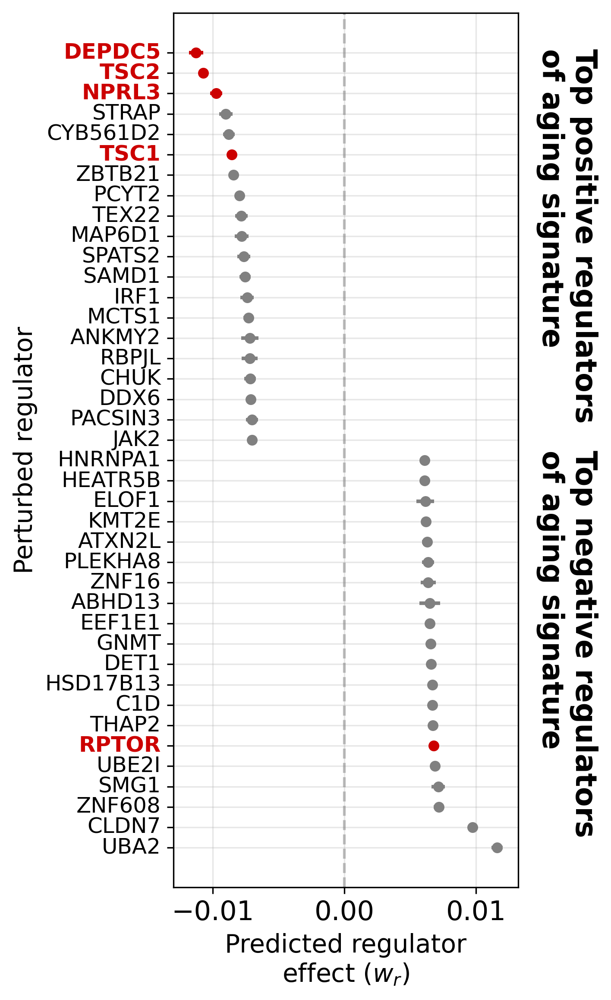

In [53]:
dataset_key = 'CD4T_Rest'
legend_on = False
model, X, y_train = comparison_results[dataset_key]
mod_coefs = model.get_coefs()
        
# Get ranks of coefficients and normalize to 0-1
coef_mean = mod_coefs['coef_mean']
coef_ranks = coef_mean.rank(ascending=False)
n_coefs = len(coef_ranks)
normalized_ranks = (coef_ranks - 1) / (n_coefs - 1)  # Normalize to 0-1 range
mod_coefs['coef_rank'] = normalized_ranks

mod_coefs['regulator'] = mod_coefs.index.str.split('_').str[0]
mod_coefs['known_regulators'] = mod_coefs['regulator'].isin(regulator_type.keys())
mod_coefs['dataset_key'] = dataset_key

# Add regulator type column
mod_coefs['regulator_type'] = mod_coefs['regulator'].map(regulator_type)
mod_coefs['regulator_type'] = mod_coefs['regulator_type'].fillna('Unknown')

# Sort by coefficient mean and get top/bottom 50
top_50 = mod_coefs.nlargest(20, 'coef_mean')
bottom_50 = mod_coefs.nsmallest(20, 'coef_mean')
plot_df = pd.concat([top_50, bottom_50]).sort_values('coef_mean', ascending=False)

# Create x-axis indices
y_indices = np.arange(len(plot_df))

# Create the plot
plt.figure(figsize=(5, 8))

# Plot points for each regulator type in specific order
regulator_palette = {
    'mTORC1 pathway':'#CC0000',
    'Unknown': 'grey'
}

for reg_type in regulator_palette.keys():
    mask = plot_df['regulator_type'] == reg_type
    plt.errorbar(x=plot_df[mask]['coef_mean'],
                y=y_indices[mask.values],
                xerr=plot_df[mask]['coef_sem'],
                fmt='o',
                capsize=0,
                label=reg_type,
                color=regulator_palette[reg_type],
                markersize=5,
                linewidth=2)

plt.yticks(y_indices, plot_df['regulator'], rotation=0, ha='right', va='center', fontsize=12)
# Color y-axis labels based on regulator type
ax = plt.gca()
for tick, regulator in zip(ax.get_yticklabels(), plot_df['regulator']):
    reg_type = plot_df[plot_df['regulator'] == regulator]['regulator_type'].iloc[0]
    if reg_type == 'Unknown':
        tick.set_color('black')
    else:
        tick.set_color(regulator_palette[reg_type])
        tick.set_fontweight('bold')

plt.xlabel('Predicted regulator\neffect ($w_r$)', fontsize=14)
plt.ylabel('Perturbed regulator', fontsize=14)
if legend_on:
    legend = plt.legend(['mTORC1 pathway'], loc='upper right', title='', fontsize=16, frameon=True)
    legend.get_title().set_fontweight('bold')
else:
    plt.legend([], frameon=False)

plt.grid(True, alpha=0.3)

# Add vertical line at x=0
plt.axvline(x=0, color='gray', linestyle='--', alpha=0.5)

# Calculate midpoint between top and bottom regulators
mid_point = len(plot_df) // 2
plt.annotate('Top negative regulators\nof aging signature', xy=(plt.xlim()[1], mid_point/2), 
            xytext=(10, 0), textcoords='offset points', rotation=270,
            ha='left', va='center', weight='bold', fontsize=16)
plt.annotate('Top positive regulators\nof aging signature', xy=(plt.xlim()[1], mid_point + mid_point/2),
            xytext=(10, 0), textcoords='offset points', rotation=270,
            ha='left', va='center', weight='bold', fontsize=16)

plt.tight_layout()
plt.savefig('./results/aging_regulators_coefs.png');
plt.savefig('./results/aging_regulators_coefs.pdf');

plt.show()

In [28]:
# ## Read clustering results
# ad_clusters = anndata.experimental.read_lazy('/mnt/oak//users/emma/data/GWT/CD4i_final/nde75ntotal50_varfiltered_simple_clustering.h5ad')
# ad_clusters_obs = ad_clusters.obs.to_dataframe()
# # ad_clusters_obs = ad_clusters_obs[ad_clusters_obs.culture_condition == 'Rest'].set_index('target_contrast_gene_name_corrected')[['hdbscan']].copy()

# corum_enrichment = pd.read_csv('../6_functional_interaction/results/corum_enrichment_nde75ntotal50.csv')
# kegg_enrichment = pd.read_csv('../6_functional_interaction/results/kegg_enrichment_nde75ntotal50.csv')
# reactome_enrichment = pd.read_csv('../6_functional_interaction/results/reactome_enrichment_nde75ntotal50.csv')

# kegg_enrichment_down = pd.read_csv('../6_functional_interaction/results/kegg_enrichment_nde75ntotal50_downstream.csv')
# reactome_enrichment_down = pd.read_csv('../6_functional_interaction/results/reactome_enrichment_nde75ntotal50_downstream.csv')

,baseMean,log_fc,lfcSE,stat,pvalue,adj_p_value,variable,perturbseq_gene,zscore
gene_name,,,,,,,,,
AACS,0.946804,-0.000959,0.020152,-0.047598,0.962037,0.979288,ENSG00000081760,False,-0.047598
AAGAB,2.824447,0.022253,0.013123,1.695753,0.089933,0.222501,ENSG00000103591,False,1.695753
AAK1,67.478179,-0.018206,0.004546,-4.004795,0.000062,0.000900,ENSG00000115977,False,-4.004795
AAMDC,3.015186,0.009699,0.012840,0.755402,0.450008,0.626275,ENSG00000087884,False,0.755402
AASDH,4.459063,-0.001469,0.010056,-0.146092,0.883849,0.934258,ENSG00000157426,False,-0.146092
...,...,...,...,...,...,...,...,...,...
ZUP1,1.173633,0.011342,0.019939,0.568840,0.569464,0.721350,ENSG00000153975,False,0.568840
ZWILCH,0.870538,0.020553,0.022117,0.929297,0.352735,0.540686,ENSG00000174442,False,0.929297
ZXDC,1.390135,0.029648,0.019090,1.553029,0.120416,0.271378,ENSG00000070476,False,1.553029


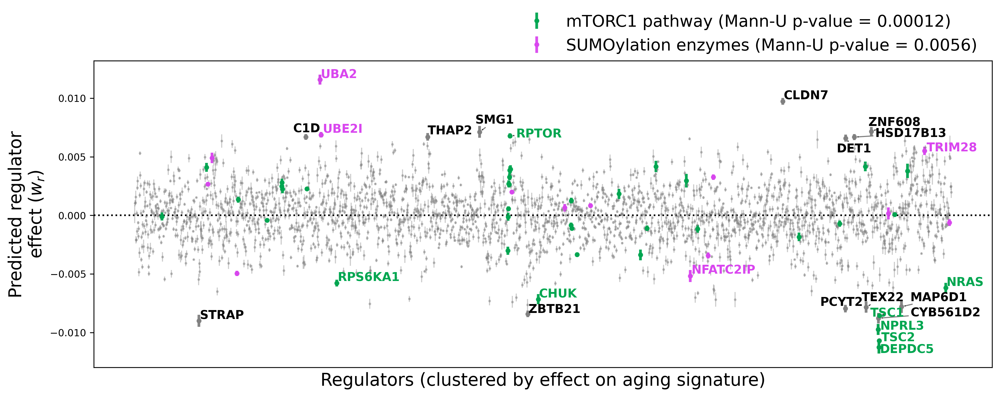

In [87]:
from scipy.stats import mannwhitneyu
from adjustText import adjust_text

SUMOylation_genes = pd.read_table('../../metadata/protein_sumoylation_GO0016925.txt', header=None)[0].tolist()

mtor_targets = DE_stats[DE_stats['target_name'].isin(KEGG_sets['mTOR signaling pathway']) & (DE_stats.n_total_de_genes > 3)].target_name.unique()
sumo_targets = DE_stats[DE_stats['target_name'].isin(SUMOylation_genes) & (DE_stats.n_total_de_genes > 3)].target_name.unique()

signature_gs = train_signatures['CD4T'][train_signatures['CD4T'].adj_p_value < 0.01].index.tolist()
df2cluster = X.T[np.intersect1d(signature_gs, X.index)]

# Compute hierarchical clustering and get cluster assignments
linkage = scipy.cluster.hierarchy.linkage(df2cluster, method='ward')
leaves_order = scipy.cluster.hierarchy.leaves_list(linkage)

# Map cluster assignments to gene names (regulators)
cluster_df = pd.DataFrame({'regulator': df2cluster.index})
cluster_df = cluster_df.iloc[leaves_order]
ordered_regs = cluster_df['regulator'].tolist()

coef_mean_pl = mod_coefs.loc[ordered_regs]
coef_mean_pl.index = coef_mean_pl.index.str.split("_").str[0]
coef_mean_pl = coef_mean_pl.reset_index()
coef_mean_pl['rank'] = range(len(coef_mean_pl))
coef_mean_pl = coef_mean_pl.set_index('index')
coef_mean_pl = coef_mean_pl[~coef_mean_pl['coef_mean'].isna()]

# Concatenate cluster_df to coef_mean_pl
cluster_df = cluster_df.set_index('regulator')
cluster_df.index = cluster_df.index.str.split('_').str[0]
coef_mean_pl = pd.concat([coef_mean_pl, cluster_df], axis=1)

# Plot highlighting mTOR and SUMOylation genes
mtor_targets_pl = np.intersect1d(mtor_targets, coef_mean_pl.index)
sumo_targets_pl = np.intersect1d(sumo_targets, coef_mean_pl.index)

abs_coef_mtor = np.abs(coef_mean_pl.loc[mtor_targets_pl, 'coef_mean'])
abs_coef_sumo = np.abs(coef_mean_pl.loc[sumo_targets_pl, 'coef_mean'])
abs_coef_all = np.abs(coef_mean_pl['coef_mean'])
_, mtor_pvalue = mannwhitneyu(abs_coef_mtor, abs_coef_all, alternative='greater')
_, sumo_pvalue = mannwhitneyu(abs_coef_sumo, abs_coef_all, alternative='greater')

# Get top 20 genes by absolute coefficient value
top_20_genes = pd.concat([
        coef_mean_pl['coef_mean'].nsmallest(10),
        coef_mean_pl['coef_mean'].nlargest(10)
        ])

plt.figure(figsize=(13, 5.5))

plt.errorbar(
    coef_mean_pl['rank'], coef_mean_pl['coef_mean'],
    yerr=coef_mean_pl['coef_sem'] if 'coef_sem' in coef_mean_pl.columns else None, 
    fmt='.', color='grey', markersize=3, rasterized=True, alpha=0.4, elinewidth=1, capsize=0
)

plt.errorbar(
    coef_mean_pl.loc[top_20_genes.index]['rank'], coef_mean_pl.loc[top_20_genes.index].coef_mean,
    yerr=coef_mean_pl.loc[top_20_genes.index]['coef_sem'] if 'coef_sem' in coef_mean_pl.columns else None,
    fmt='.', color='grey', markersize=7, rasterized=True, elinewidth=2.5, capsize=0, alpha=0.95
)

plt.errorbar(
    coef_mean_pl.loc[mtor_targets_pl]['rank'], coef_mean_pl.loc[mtor_targets_pl].coef_mean,
    yerr=coef_mean_pl.loc[mtor_targets_pl]['coef_sem'] if 'coef_sem' in coef_mean_pl.columns else None,
    fmt='.', color=palettes['pathways']['mTORC1'], markersize=7, rasterized=True, 
    label=f'mTORC1 pathway (Mann-U p-value = {mtor_pvalue:.2g})', elinewidth=2.5, capsize=0, alpha=0.95
)
plt.errorbar(
    coef_mean_pl.loc[sumo_targets_pl]['rank'], coef_mean_pl.loc[sumo_targets_pl].coef_mean,
    yerr=coef_mean_pl.loc[sumo_targets_pl]['coef_sem'] if 'coef_sem' in coef_mean_pl.columns else None,
    fmt='.', color=palettes['pathways']['SUMO'], markersize=7, rasterized=True, 
    label=f'SUMOylation enzymes (Mann-U p-value = {sumo_pvalue:.2g})', elinewidth=2.5, capsize=0, alpha=0.95
)

# Add dotted line at coefficient = 0
plt.axhline(y=0, color='black', linestyle=':', alpha=1)

# Annotate top 20 genes using adjusttext

annotate_genes = pd.concat([
        coef_mean_pl['coef_mean'].nsmallest(50),
        coef_mean_pl['coef_mean'].nlargest(50)
        ])
annotate_genes = annotate_genes[(annotate_genes.index.isin(mtor_targets_pl)) | (annotate_genes.index.isin(sumo_targets_pl)) | (annotate_genes.index.isin(top_20_genes.index)) ]

texts = []
for gene, value in annotate_genes.items():
    idx = ordered_regs.index(gene + '_Rest')
    if gene in mtor_targets_pl:
        texts.append(plt.text(idx, coef_mean.loc[ordered_regs].values[idx], gene, color=palettes['pathways']['mTORC1'],
                    fontweight='bold', fontsize=11))
    elif gene in sumo_targets_pl:
        texts.append(plt.text(idx, coef_mean.loc[ordered_regs].values[idx], gene, color=palettes['pathways']['SUMO'],
                    fontweight='bold', fontsize=11))
    else:
        texts.append(plt.text(idx, coef_mean.loc[ordered_regs].values[idx], gene, 
                    fontweight='bold', fontsize=11))

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='black', alpha=0.5))

plt.legend(frameon=False, loc="upper right", bbox_to_anchor=(1.0, 1.2), ncol=1)
plt.xlabel('Regulators (clustered by effect on aging signature)', fontsize=16)
plt.ylabel('Predicted regulator\neffect ($w_r$)', fontsize=16)
plt.xticks([])
plt.yticks(fontsize=9)
plt.tight_layout()
plt.savefig('./results/aging_regulators_coefs_full.png');
plt.savefig('./results/aging_regulators_coefs_full.pdf');

In [40]:
# # Sort hdbscan values by mean coef_mean
# hdbscan_means = coef_mean_pl.groupby('hdbscan')['coef_mean'].mean().sort_values()
# hdbscan_order = hdbscan_means.index.tolist()
# plt.figure(figsize=(5,12))
# sns.stripplot(
#     data=coef_mean_pl,
#     y='hdbscan',
#     x='coef_mean',
#     order=hdbscan_order
# )

In [88]:
# show_clusters = coef_mean_pl.loc[top_20_genes.index]['cluster'].dropna().unique()
# clustered_targets = coef_mean_pl.index[coef_mean_pl.cluster.isin(show_clusters)]

# # Get top 20 genes by absolute coefficient value
# top_20_genes = coef_mean_pl['coef_mean'].abs().nlargest(40)

# plt.figure(figsize=(15, 6))
# sns.scatterplot(x=coef_mean_pl['rank'], y=coef_mean_pl.coef_mean, rasterized=True, legend=False, color='grey')

# # Ensure cluster is categorical to color as discrete groups
# plot_df = coef_mean_pl.loc[clustered_targets].copy()
# plot_df['cluster'] = plot_df['cluster'].astype('category')

# sns.scatterplot(
#     x=plot_df['rank'],
#     y=plot_df['coef_mean'],
#     hue=plot_df['cluster'],
#     palette='tab10',   # Or other categorical palette as desired
#     rasterized=True,
#     legend=False
# )

# # Add dotted line at coefficient = 0
# plt.axhline(y=0, color='black', linestyle=':', alpha=1)

# # Annotate top 20 genes using adjusttext
# from adjustText import adjust_text

# texts = []
# for gene, value in top_20_genes.items():
#     idx = ordered_regs.index(gene + '_Rest')
#     texts.append(plt.text(idx, coef_mean.loc[ordered_regs].values[idx], gene, 
#                 fontweight='bold', fontsize=10))

# adjust_text(texts, arrowprops=dict(arrowstyle='->', color='black'))

# # plt.title('Coefficient Values with Top 20 Genes Annotated')
# plt.xlabel('Regulators (clustered by perturbation effect)', fontsize=14)
# plt.ylabel('Coefficient Value', fontsize=14)
# plt.xticks([], fontsize=12)
# plt.yticks(fontsize=12)
# plt.tight_layout()
# # plt.savefig('./results/aging_regulators_coefs_full.png');
# # plt.savefig('./results/aging_regulators_coefs_full.pdf');

Compare baseline expression

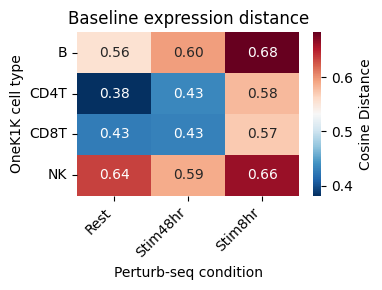

In [35]:
# Comparison of baseline mean expression
pseq_base_means = get_DE_results_long(adata_de, targets=['GATA3'], effect_estimates='baseMean', gene_id_col='gene_ids')
pseq_base_means = pseq_base_means.pivot(columns='culture_condition', index='gene_ids', values='baseMean').dropna()
onek1k_base_means = pd.concat([x[['variable', 'baseMean']].set_index('variable').rename({'baseMean':k}, axis=1) for k,x in train_signatures.items()], axis=1)
all_base_means = pd.concat([pseq_base_means, onek1k_base_means], axis=1).dropna()
from scipy.spatial.distance import pdist, squareform
base_means_dist = pd.DataFrame(squareform(pdist(all_base_means.T)), 
                             index=all_base_means.columns,
                             columns=all_base_means.columns)
pseq_cols = pseq_base_means.columns
onek1k_cols = onek1k_base_means.columns

# Calculate cosine distances between conditions
from scipy.spatial.distance import cosine
dist_long = pd.DataFrame([
    {'onek1k_condition': col1,
     'pseq_condition': col2, 
     'distance': cosine(all_base_means[col1], all_base_means[col2])}
    for col1 in onek1k_cols
    for col2 in pseq_cols
])

# Create heatmap
plt.figure(figsize=(4,3))
sns.heatmap(data=dist_long.pivot(index='onek1k_condition', columns='pseq_condition', values='distance'),
            cmap='RdBu_r', annot=True, fmt='.2f',
            cbar_kws={'label': 'Cosine Distance'})
plt.xticks(rotation=45, ha='right');
plt.yticks(rotation=0);
plt.xlabel('Perturb-seq condition');
plt.ylabel('OneK1K cell type');
plt.title('Baseline expression distance');
plt.tight_layout()

In [314]:
# # Get top 20 components and plot as heatmap
# components = p2t_model.pcas[0].components_[:20]
# plt.figure(figsize=(12, 8))
# sns.clustermap(components, cmap='RdBu_r', center=0)
# plt.xlabel('Genes')
# plt.ylabel('PC')
# plt.title('Top 20 Principal Components')

## Train best model

In [90]:
p2t_model, X, y_train = comparison_results[dataset_key]

In [91]:
# fig, ax = plt.subplots(figsize=(10,10))
# p2t_model.plot_prediction(X_perturbs_masked, y_target, plot_metric='pearson', annotate_top_n=50, ax=ax)
# plt.show()

In [92]:
def plot_regulator_effects(
    adata_de, 
    genes, 
    regulators, 
    y_target, 
    sort_by='perturbation', 
    figsize=(18, 6), 
    condition='Rest', 
    palette=None, 
    ax=None
):
    """Plot effects of regulators on target genes.
    
    Args:
        adata_de: AnnData-format DE results
        genes: List of target genes to plot
        regulators: List of regulators to analyze
        y_target: Series with aging effects
        sort_by: String, 'perturbation', 'aging', or 'original'
        figsize: Figure size if creating new figure
        condition: DE condition (e.g. 'Rest')
        palette: Optional color palette
        ax: Optional matplotlib axis handle to plot into
    """

    # Get DE results and pivot to wide format
    long_de_results = get_DE_results_long(adata_de, targets=regulators, genes=genes, gene_id_col='gene_name')
    long_de_results = long_de_results[long_de_results['culture_condition'] == condition].copy()
    wide_de_results = long_de_results.pivot(index='gene', columns='target_contrast_gene_name', values='zscore').T
    wide_de_results_signif = long_de_results.pivot(index='gene', columns='target_contrast_gene_name', values='adj_p_value').T

    pl_df = wide_de_results.loc[regulators, genes].reset_index().melt(id_vars='target_contrast_gene_name')
    signif = wide_de_results_signif.loc[regulators, genes] < 0.1
    # Calculate mean values per gene
    gene_means = pl_df.groupby('gene')['value'].mean()
    # Sort either by aging effect (y_target) or mean perturbation effect
    if sort_by == 'aging':
        gene_order = y_target.loc[genes].sort_values().index
    elif sort_by == 'perturbation':
        gene_order = wide_de_results.loc[regulators, genes].mean().sort_values().index
    else:
        gene_order = genes # Keep original order
    pl_df['aging_effect'] = y_target.loc[pl_df['gene']].values
    pl_df['target_contrast_gene_name'] = pl_df['target_contrast_gene_name'].astype(str)
    pl_df['significant'] = False
    for gene in regulators:
        for target in genes:
            pl_df.loc[(pl_df['target_contrast_gene_name'] == gene) & (pl_df['gene'] == target), 'significant'] = signif.loc[gene, target]

    # If ax is not provided, create figure and get current axis
    _created_fig = False
    if ax is None:
        plt.figure(figsize=figsize)
        ax = plt.gca()
        _created_fig = True

    ax.axvline(x=0, color='grey', linestyle=':', zorder=0)

    if palette is None:
        palette = {name: sns.color_palette('Pastel1')[i] 
              for i, name in enumerate(pl_df['target_contrast_gene_name'].unique())}

    # Create base stripplot with legend using ordered regulators
    sns.stripplot(
        data=pl_df[~pl_df.significant], 
        y='gene', 
        x='value', 
        hue='target_contrast_gene_name', 
        dodge=False, 
        palette=palette, 
        legend=False,
        order=gene_order, 
        size=8, 
        alpha=0.5,
        ax=ax
    )

    # Add points with black outline for significant values, no legend
    sns.stripplot(
        data=pl_df[pl_df.significant], 
        y='gene', 
        x='value', 
        hue='target_contrast_gene_name', 
        dodge=False, 
        edgecolor='black', 
        linewidth=1, 
        palette=palette, 
        legend=True,
        order=gene_order, 
        size=8, 
        alpha=0.7,
        ax=ax
    )

    # Add scatter points for aging effect
    sns.scatterplot(
        data=pl_df, 
        y='gene', 
        x='aging_effect', 
        s=200, color='black', marker='*', label='Aging signature effect', ax=ax
    )

    # Adjust y-axis labels
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=12)

    # Add axis labels
    ax.set_ylabel('Signature genes', fontsize=14)
    ax.set_xlabel('Perturb-seq effect size\n(DE z-score)', fontsize=14)

    # Add white point with black outline to legend to indicate significance
    ax.scatter([], [], c='white', edgecolor='black', linewidth=1, s=80, label='Significant effect (10% FDR)')

    # Move legend outside with larger font
    ax.legend(
        bbox_to_anchor=(1.05, 1), 
        loc='upper left', 
        title='Target gene', 
        fontsize=12, 
        title_fontsize=14, 
        frameon=False,
        # handletextpad=2
    )

    if _created_fig:
        plt.tight_layout()

In [93]:
# mtor_genes_up = KEGG_sets['mTOR signaling pathway'] + reactome_gene_sets['REACTOME_MTOR_SIGNALLING'] + reactome_gene_sets['REACTOME_AMINO_ACIDS_REGULATE_MTORC1'] + reactome_gene_sets['REACTOME_MTORC1_MEDIATED_SIGNALLING']
# plot_regulator_effects(adata_de, np.intersect1d(mtor_genes_up, y_target.index), gr, y_target, figsize=(10,4))
# plt.xlabel('CD4T aging signature genes (mTOR signalling pathway)')


In [94]:
# mtor_signif_aging = signature[signature['gene_name'].isin(KEGG_sets['mTOR signaling pathway']) & (signature['adj_p_value'] < 0.01)]['gene_name'].values
# mtor_signif_aging

In [95]:
# gr = ['DEPDC5', 'TSC2', 'NPRL3', 'CYB561D2']
# # Get absolute means for each row
# gene_means = wide_de_results.loc[gr].mean()
# abs_means = wide_de_results.loc[gr].abs().mean()

# # Sort by absolute means and get top n rows
# top_n = 20  # Adjust this value as needed
# top_n_genes = abs_means.nlargest(top_n).index

# # Get all mTOR genes
# mtor_genes = pd.Index(mtor_signif_aging)
# # Combine top_n and all mTOR genes, preserving order and removing duplicates
# concatenated = np.concatenate([top_n_genes, mtor_genes])
# top_rows = pd.Index(pd.Series(concatenated).drop_duplicates(), name='gene')
# signif = wide_de_results_signif.T.loc[gr, top_rows] < 0.1

# pl_df = wide_de_results.loc[gr, means.loc[top_rows].sort_values().index].reset_index().melt(id_vars='target_contrast_gene_name')
# signif = wide_de_results_signif.T.loc[gr, top_rows] < 0.1

# # Calculate mean values per gene separately for top_n and mTOR genes
# gene_means = pl_df.groupby('gene')['value'].mean()
# top_n_means = gene_means[top_n_genes].sort_values()
# mtor_means = gene_means[mtor_genes].sort_values()

# # Combine ordered indices
# concatenated = np.concatenate([top_n_means.index, mtor_means.index])
# gene_order = pd.Index(pd.Series(concatenated).drop_duplicates())

# pl_df['aging_effect'] = y_target.loc[pl_df['gene']].values
# pl_df['target_contrast_gene_name'] = pl_df['target_contrast_gene_name'].astype(str)
# pl_df['significant'] = False
# for gene in gr:
#     for target in top_rows:
#         pl_df.loc[(pl_df['target_contrast_gene_name'] == gene) & (pl_df['gene'] == target), 'significant'] = signif.loc[gene, target]

# plt.figure(figsize=(12, 6))
# plt.axhline(y=0, color='grey', linestyle=':', zorder=0)

# palette = {name: sns.color_palette('Pastel1')[i] 
#           for i, name in enumerate(pl_df['target_contrast_gene_name'].unique())}


# # Create base stripplot with legend using ordered genes
# ax = sns.stripplot(data=pl_df[~pl_df.significant], x='gene', y='value', 
#                   hue='target_contrast_gene_name', dodge=False, palette=palette,
#                   order=gene_order, size=8, alpha=0.5)

# # Add points with black outline for significant values, no legend
# ax = sns.stripplot(data=pl_df[pl_df.significant], x='gene', y='value', 
#                   hue='target_contrast_gene_name', dodge=False, 
#                   edgecolor='black', linewidth=1, palette=palette, legend=False,
#                   order=gene_order, size=8, alpha=0.7)

# # Add scatter points for aging effect
# sns.scatterplot(data=pl_df, x='gene', y='aging_effect', s=200, color='black', marker='*', label='Aging signature effect')

# # Rotate x-axis labels
# plt.xticks(rotation=45, ha='right', fontsize=12)
# plt.yticks(fontsize=12)

# # Add axis labels
# plt.xlabel('CD4T aging signature genes', fontsize=14)
# plt.ylabel('Perturb-seq effect size\n(DE z-score)', fontsize=14)

# # Move legend outside with larger font
# # Rotate x-axis labels
# plt.xticks(rotation=45, ha='right', fontsize=12)
# plt.yticks(fontsize=12)

# # Add axis labels
# plt.xlabel('CD4T aging signature genes', fontsize=14)
# plt.ylabel('Perturb-seq effect size\n(DE z-score)', fontsize=14)

# # Move legend outside with larger font
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Target gene', fontsize=12, title_fontsize=14)

In [96]:
# gr = ['TEX22', 'TAP1', 'RAB2B', 'AMIGO1', 'C4orf47', 'RBPJL', 'YPEL5']
# gr = ['STARD10']
# # Get absolute means for each row
# # means = y_target
# means = wide_de_results.loc[gr].mean()
# abs_means = wide_de_results.loc[gr].abs().mean()

# # Sort by absolute means and get top n rows
# top_n = 20  # Adjust this value as needed
# top_rows = abs_means.nlargest(top_n).index
# signif = wide_de_results_signif.T.loc[gr, top_rows] < 0.1

# sign_effect = y_target.loc[top_rows]

# # Create figure with two subplots
# fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(n_cols/2, n_rows/2 + 1), 
#                               gridspec_kw={'height_ratios': [1, 4]}, sharex=True)

# # Plot sign effect heatmap on top
# sns.heatmap(sign_effect.to_frame().T, 
#             cmap='bwr',
#             center=0,
#             ax=ax1,
#             xticklabels=True,
#             yticklabels=False,
#             cbar=False)

# # Plot main heatmap below
# sns.heatmap(wide_de_results.loc[gr, means.loc[top_rows].sort_values().index],
#             cmap='bwr',
#             center=0, 
#             xticklabels=True,
#             yticklabels=True,
#             ax=ax2)

# # Add significance markers
# for y, row in enumerate(wide_de_results.loc[gr, top_rows].index):
#     for x, col in enumerate(wide_de_results.loc[gr, top_rows].columns):
#         if signif.loc[row, col]:
#             ax2.plot(x + 0.5, y + 0.5, 'o', markersize=5, color='black')

# plt.tight_layout()


### mTORC1 

In [97]:
import gseapy as gp
from gseapy import Msigdb
from gseapy import barplot, dotplot

msig = Msigdb()
kegg_gene_sets = msig.get_gmt(category= 'c2.cp.kegg_legacy', dbver="2025.1.Hs")
reactome_gene_sets = msig.get_gmt(category= 'c2.cp.reactome', dbver="2025.1.Hs")
hallmark_gene_sets = msig.get_gmt(category= 'h.all', dbver="2025.1.Hs")

In [98]:
def run_enrichr_all(res_df, target_name, hallmark_gene_sets):
    gs_down = res_df[(res_df['adj_p_value'] < 0.1) & (res_df.log_fc < 0)]['gene_name'].tolist()
    gs_up = res_df[(res_df['adj_p_value'] < 0.1) & (res_df.log_fc > 0)]['gene_name'].tolist()
    gs_all = res_df['gene_name'].tolist()

    # Up-regulated enrichment
    enr_up = gp.enrichr(
        gene_list=gs_up,
        gene_sets={**hallmark_gene_sets},
        organism='human',
        outdir=None,
        background=gs_all
    )
    df_up = enr_up.results.copy()
    df_up['direction'] = 'up'
    df_up['target'] = target_name
    
    # Down-regulated enrichment
    enr_down = gp.enrichr(
        gene_list=gs_down,
        gene_sets={**hallmark_gene_sets},
        organism='human',
        outdir=None,
        background=gs_all
    )
    df_down = enr_down.results.copy()
    df_down['direction'] = 'down'
    df_down['target'] = target_name
    
    return df_up, df_down

# Prepare DE results for RPTOR and TSC1
RPTOR_pert_de = get_DE_results_long(adata_de[adata_de.obs['culture_condition'] == 'Rest'], targets=['RPTOR'])
TSC1_pert_de = get_DE_results_long(adata_de[adata_de.obs['culture_condition'] == 'Rest'], targets=['TSC2'])

# Run enrichment and get up/down for both
rptor_up, rptor_down = run_enrichr_all(RPTOR_pert_de, 'RPTOR', hallmark_gene_sets)
tsc1_up, tsc1_down = run_enrichr_all(TSC1_pert_de, 'TSC2', hallmark_gene_sets)

enrichment_concat = pd.concat([rptor_up, rptor_down, tsc1_up, tsc1_down], ignore_index=True)
enrichment_concat = enrichment_concat.sort_values(['target', 'direction', 'Adjusted P-value']).reset_index(drop=True)

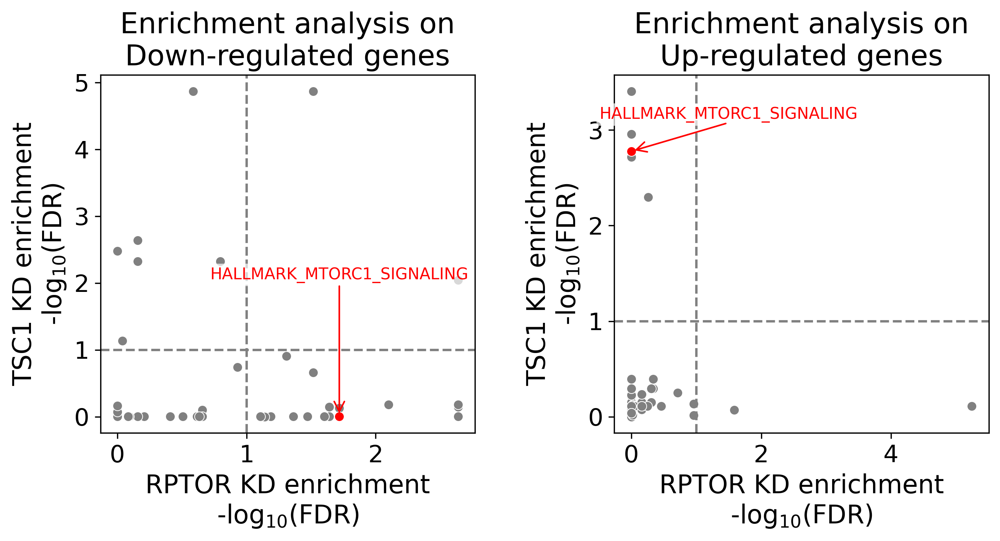

In [99]:
mtor_sets = ['HALLMARK_MTORC1_SIGNALING']

enrichment_concat['log10_fdr'] = -np.log10(enrichment_concat['Adjusted P-value'])

fig, axes = plt.subplots(1, 2, figsize=(9, 5))

xy_offset = {
    'down': (0, 2),
    'up':(1.5,0.3)
}

for i, direction in enumerate(['down', 'up']):
    ax = axes[i]
    pl_df = enrichment_concat[enrichment_concat['direction'] == direction].pivot(columns='target', index='Term', values='log10_fdr').fillna(0)
    highlight = pl_df.index.isin(mtor_sets)

    # Plot non-highlighted points first (zorder=1)
    sns.scatterplot(
        data=pl_df[~highlight],
        x='RPTOR',
        y='TSC2',
        color='grey',
        legend=False,
        zorder=1,
        ax=ax,
    )

    sns.scatterplot(
        data=pl_df[highlight],
        x='RPTOR',
        y='TSC2',
        color='red',
        legend=False,
        zorder=2,
        ax=ax,
    )

    for term in pl_df.index[highlight]:
        x = pl_df.loc[term, 'RPTOR']
        y = pl_df.loc[term, 'TSC2']
        ax.text(
            x + xy_offset[direction][0], 
            y + xy_offset[direction][1], 
            term, 
            color='red', 
            fontsize=10, 
            ha='center', 
            va='bottom',
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.7, boxstyle='round,pad=0.2')
        )
        # Add an arrow pointing to the highlighted point
        ax.annotate(
            '',
            xy=(x, y),
            xytext=(x + xy_offset[direction][0], y + xy_offset[direction][1]),
            arrowprops=dict(arrowstyle='->', color='red')
        )
    ax.axhline(y=1, color='grey', linestyle='--')
    ax.axvline(x=1, color='grey', linestyle='--')
    ax.set_xlabel('RPTOR KD enrichment\n-log$_{10}$(FDR)', fontsize=ax.xaxis.label.get_size())
    ax.set_ylabel('TSC1 KD enrichment\n-log$_{10}$(FDR)', fontsize=ax.yaxis.label.get_size())
    ax.set_title(f'Enrichment analysis on\n{"Down-regulated" if direction == "down" else "Up-regulated"} genes')

plt.tight_layout()
plt.savefig('./results/RPTOR_vs_TSC_enrichment.pdf')



In [213]:
# # Create color mapping for culture conditions
# pivoted = pseq_effect.pivot(columns='target_contrast_gene_name', index='gene', values='zscore')
# corr_matrix = pivoted.corr()
# # conditions = corr_matrix.columns.get_level_values('culture_condition')

# # color_map = {
# #     'Rest': [0.8, 0.2, 0.2],
# #     'Stim48hr': [0.2, 0.2, 0.8], 
# #     'Stim8hr': [0.2, 0.8, 0.2]
# # }

# # col_colors = pd.DataFrame(
# #     [color_map[cond] for cond in conditions],
# #     index=corr_matrix.columns
# # )

# # # Create list of RGBA colors
# # col_colors_rgba = [[*color_map[cond], 1.0] for cond in conditions]

# sns.clustermap(
#     corr_matrix,
#     cmap='bwr',
#     center=0,
#     xticklabels=True,
#     yticklabels=True,
#     figsize=(12,12),
#     # col_colors=col_colors_rgba,
#     # row_colors=col_colors_rgba
# )

### Plot DE effects of predicted regulators

In [141]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

st = 'age'
top_quant = 0.01
n_top = 50
alpha = 0.01
c = "Rest"
ct = 'CD4T'
p2t_model = comparison_results[f"{ct}_{c}"][0]

# Get top DE genes for input signature
train_df = train_signatures[ct]
train_df['contrast'] = ct

# Get target state values
state_results_df = train_df.reset_index()
signature_effect_size = state_results_df[(state_results_df['adj_p_value'] < alpha) & 
                                       (abs(state_results_df['zscore']) > 6)].sort_values('zscore')
signature_gs = signature_effect_size.gene_name.tolist()
len(signature_gs)

# Get top x% of coefficients by absolute value
n = len(p2t_model.get_coefs()['coef_mean'])
st_coefs = p2t_model.get_coefs()
abs_coefs = st_coefs['coef_mean'].abs()
# top_abs_coefs = abs_coefs.nlargest(int(n * top_quant))
top_abs_coefs = abs_coefs.nlargest(n_top)
top_regs = st_coefs['coef_mean'][top_abs_coefs.index]
predicted_effect_size = top_regs.sort_values(ascending=False)
predicted_regulators = predicted_effect_size.index.tolist()
predicted_regulators = [x.replace(f"_{c}", '') for x in predicted_regulators]
predicted_effect_size.index = predicted_regulators

# Get DE results and pivot to wide format
long_de_results = get_DE_results_long(adata_de, targets=predicted_regulators, genes=signature_gs, gene_id_col='gene_name')
long_de_results = long_de_results[long_de_results['culture_condition'] == c].copy()
wide_de_results = long_de_results.pivot(index='gene', columns='target_contrast_gene_name', values='zscore')
wide_de_results_signif = long_de_results.pivot(index='gene', columns='target_contrast_gene_name', values='adj_p_value')

# Create a mask for diagonal values and low zscore values
mask = pd.DataFrame(False, index=wide_de_results.index, columns=wide_de_results.columns)
for idx in wide_de_results.index:
    if idx in wide_de_results.columns:
        mask.loc[idx, idx] = True
# Add mask for abs zscore < 1
mask = mask | (wide_de_results.abs() < 1)
wide_de_results = wide_de_results.mask(mask, 0)
wide_de_results = wide_de_results.T

# Define axis labels
wide_de_results.index.name = 'Regulators (CRISPRi targets)'
wide_de_results.columns.name = f'{st} signature genes ({alpha*100}% FDR)'
wide_de_results = wide_de_results.dropna(axis=1)

In [100]:
# Create row annotation dataframe with predicted effect sizes (now rows after transpose)
row_annot = pd.DataFrame({
    'Predicted regulatory effect': predicted_effect_size[wide_de_results.index]
})

# Create column annotation dataframe with signature zscores (now columns after transpose)
col_annot = pd.DataFrame({
    'zscore': signature_effect_size.set_index('gene_name').loc[wide_de_results.columns, 'zscore']
})

# Create different color maps for annotations
cmap_row = plt.cm.PiYG_r    # Pink-Yellow-Green for row annotation (predicted effect size)
cmap_col = plt.cm.RdYlBu_r  # Red-Yellow-Blue for column annotation (signature zscore)

# Center the colormaps at 0 by using symmetric vmin/vmax
vmax_row = max(abs(row_annot['Predicted regulatory effect'].min()), abs(row_annot['Predicted regulatory effect'].max()))
vmax_col = max(abs(col_annot['zscore'].min()), abs(col_annot['zscore'].max()))
# Create color series for annotations (seaborn expects Series, not DataFrame with RGBA)
row_colors = row_annot['Predicted regulatory effect'].apply(lambda x: cmap_row((x + vmax_row) / (2 * vmax_row)))
col_colors = col_annot['zscore'].apply(lambda x: cmap_col((x + vmax_col) / (2 * vmax_col)))

# Create the clustermap
plt.figure()
vmax = 10
g = sns.clustermap(wide_de_results,
                   cmap='RdBu_r',
                   center=0,
                   vmin=-vmax,
                   vmax=vmax,
                   row_cluster=True,
                   col_cluster=True,
                   xticklabels=True,
                   yticklabels=True,
                   method='ward',
                   figsize=(30, 15),
                   row_colors=row_colors,
                   col_colors=[col_colors],
                   cbar_pos=None,
                   dendrogram_ratio=(0.1, 0.1)) # Set row dendrogram ratio to 0 to hide it

# Adjust layout to make room for additional colorbars
plt.subplots_adjust(top=0.85)

# Add colorbars for annotations - all same width and height
colorbar_width = 0.1
colorbar_height = 0.02
colorbar_left = 0
colorbar_right = 0.9

# Main heatmap colorbar - bottom
cbar_ax_main = g.fig.add_axes([colorbar_right, 0.9, colorbar_width, colorbar_height])
vmax_main = vmax
sm_main = plt.cm.ScalarMappable(cmap='RdBu_r', norm=plt.Normalize(vmin=-vmax_main, vmax=vmax_main))
sm_main.set_array([])
cbar_main = plt.colorbar(sm_main, cax=cbar_ax_main, orientation='horizontal')
cbar_main.set_label('Perturb-seq effect Z-score', fontsize=14)

# Row annotation colorbar (predicted effect size)
cbar_ax_row = g.fig.add_axes([colorbar_left, 0.9, colorbar_width, colorbar_height])
sm_row = plt.cm.ScalarMappable(cmap=cmap_row, norm=plt.Normalize(vmin=-vmax_row, vmax=vmax_row))
sm_row.set_array([])
cbar_row = plt.colorbar(sm_row, cax=cbar_ax_row, orientation='horizontal')
cbar_row.set_label('Predicted regulatory effect', fontsize=14)

# Column annotation colorbar (signature zscore)
cbar_ax_col = g.fig.add_axes([0.2, 0.9, colorbar_width, colorbar_height])
sm_col = plt.cm.ScalarMappable(cmap=cmap_col, norm=plt.Normalize(vmin=-vmax_col, vmax=vmax_col))
sm_col.set_array([])
cbar_col = plt.colorbar(sm_col, cax=cbar_ax_col, orientation='horizontal')
cbar_col.set_label('Aging signature Z-score', fontsize=14)

# Rotate x-axis labels
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=90, ha='center', fontsize=12)
plt.setp(g.ax_heatmap.get_yticklabels(), rotation=0, fontsize=12)

g.ax_heatmap.set_xlabel(f'Top {st} signature genes ({alpha*100}% FDR)', fontsize=18)
g.ax_heatmap.set_ylabel('Regulators (CRISPRi targets)', fontsize=18)
plt.savefig('results/aging_regulator_target_heatmap.pdf', bbox_inches='tight')
plt.savefig('results/aging_regulator_target_heatmap.png', bbox_inches='tight')
# plt.close()
plt.show()

NameError: name 'predicted_effect_size' is not defined

In [135]:
st = 'age'
top_quant = 0.01
n_top = 50
alpha = 0.01
c = "Rest"
ct = 'CD4T'
p2t_model = comparison_results[f"{ct}_{c}"][0]

# Get top DE genes for input signature
train_df = train_signatures[ct]
train_df['contrast'] = ct

# Get target state values
state_results_df = train_df.reset_index()
signature_effect_size = state_results_df[(state_results_df['adj_p_value'] < alpha) & 
                                       (abs(state_results_df['zscore']) > 3)].sort_values('zscore')
signature_gs = signature_effect_size.gene_name.tolist()
len(signature_gs)

# Get top x% of coefficients by absolute value
n = len(p2t_model.get_coefs()['coef_mean'])
st_coefs = p2t_model.get_coefs()
abs_coefs = st_coefs['coef_mean'].abs()
# top_abs_coefs = abs_coefs.nlargest(int(n * top_quant))
top_abs_coefs = abs_coefs.nlargest(n_top)
top_regs = st_coefs['coef_mean'][top_abs_coefs.index]
predicted_effect_size = top_regs.sort_values(ascending=False)
predicted_regulators = predicted_effect_size.index.tolist()
predicted_regulators = [x.replace(f"_{c}", '') for x in predicted_regulators]
predicted_effect_size.index = predicted_regulators

# Get DE results and pivot to wide format
long_de_results = get_DE_results_long(adata_de, targets=predicted_regulators, genes=signature_gs, gene_id_col='gene_name')
long_de_results = long_de_results[long_de_results['culture_condition'] == c].copy()
wide_de_results = long_de_results.pivot(index='gene', columns='target_contrast_gene_name', values='zscore').fillna(0)
wide_de_results_signif = long_de_results.pivot(index='gene', columns='target_contrast_gene_name', values='adj_p_value').fillna(1)

In [146]:


res_df = train_signatures['CD4T'].copy()

def plot_regulator_effects_volcano(
    res_df, 
    wide_de_results, 
    wide_de_results_signif, 
    regulators, 
    regulator_list_name, 
    regulator_sign=1, 
    text_labels=None, 
    text_labels_thresh=10, 
    return_genes=False,  
    text_label_zscore_col = 'zscore_y_abs',
    ax=None, 
    log10_fdr_cap=None,
    color = 'red'
):
    """
    Create a scatter plot showing the effects of specific regulators on gene expression.
    
    Parameters:
    -----------
    res_df : pd.DataFrame
        DataFrame with baseline gene expression results
    wide_de_results : pd.DataFrame
        Wide-format DataFrame of differential expression results 
    wide_de_results_signif : pd.DataFrame
        Wide-format DataFrame of significance values
    regulators : list
        List of regulators to analyze
    regulator_list_name : str
        Name of the regulator list for plot title
    regulator_sign: int
        Sign of regulation
    return_genes: bool
        Return controlled genes
    log10_fdr_cap: float or None
        Maximum value to cap the -log10(adjusted p-value) at (e.g. 10). If None, do not cap.
    color
    
    Returns:
    --------
    matplotlib.figure.Figure
        The generated scatter plot
    """
    res_df = res_df.copy()
    res_df['log10_fdr'] = -np.log10(res_df['adj_p_value'])
    if log10_fdr_cap is not None:
        res_df['log10_fdr'] = np.minimum(res_df['log10_fdr'], log10_fdr_cap)

    # Get perturbation effects for specified regulators
    perturb_effects = wide_de_results[regulators].copy()
    perturb_effects[wide_de_results_signif[regulators] >= 0.1] = 0
    perturb_effects = perturb_effects.mean(1).reset_index()
    perturb_effects.columns = ['gene', 'zscore']
    
    # Merge perturbation effects with baseline results
    pl_res_df = pd.merge(   
        res_df.reset_index().rename(columns={'gene_name':'gene'}),
        perturb_effects,
        on='gene', how='left'
    )
    
    # Take sign of zscore
    pl_res_df['zscore_y'] = np.where(
        np.sign(pl_res_df['zscore_y']) != (np.sign(pl_res_df['zscore_x']) * regulator_sign), 
        np.nan, 
        pl_res_df['zscore_y']
    )
    pl_res_df['zscore_y_abs'] = pl_res_df['zscore_y'].abs()
    pl_res_df['zscore_x_abs'] = pl_res_df['zscore_x'].abs()
    
    # Create plot
    if ax is None:
        plt.figure(figsize=(5, 4))  # Slightly wider to accommodate legend
        ax = plt.gca()

    pl_res_df_sorted = pl_res_df.reindex(pl_res_df['zscore_y_abs'].sort_values(ascending=True).index)

    # Background scatter
    ax.scatter(
        pl_res_df_sorted['log_fc'], 
        pl_res_df_sorted['log10_fdr'], 
        s=10, 
        color='lightgrey', 
        edgecolor='none', 
        rasterized=True
    )

    # Colored scatter based on absolute regulator effect (continuous color)
    points = ax.scatter(
        pl_res_df_sorted[~pl_res_df_sorted.zscore_y_abs.isna()]['log_fc'], 
        pl_res_df_sorted[~pl_res_df_sorted.zscore_y_abs.isna()]['log10_fdr'], 
        s=20, 
        c=color, 
        edgecolor='none', 
        vmin=1,
        rasterized=True
    )
    
    if text_labels is not None:
        from adjustText import adjust_text
        texts = []
        if isinstance(text_labels, (list, np.ndarray, pd.Series)):
            # If text_labels is a list of genes, label those genes if present in the DataFrame
            gene_set = set(text_labels)
            label_rows = pl_res_df_sorted[pl_res_df_sorted['gene'].isin(gene_set)]
        else:
            # Otherwise, fallback to labeling genes with high z-score as before
            label_rows = pl_res_df_sorted[
                (~pl_res_df_sorted['zscore_y_abs'].isna()) &
                (pl_res_df_sorted[text_label_zscore_col] > text_labels_thresh)
            ]
        for _, row in label_rows.iterrows():
            texts.append(
                ax.text(
                    row['log_fc'], 
                    row['log10_fdr'], 
                    row['gene'], 
                    fontsize=8, 
                    alpha=0.7,
                    color='black'
                )
            )
        if texts:
            adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey', alpha=0.5))

    ax.axvline(0, linestyle=":", alpha=0.5, color='black')
    ax.set_xlabel(r'DE log$_{2}$FC', fontsize=16)
    ax.set_ylabel('-log$_{10}$(FDR)', fontsize=ax.xaxis.label.get_size())
    
    ax.set_title(regulator_list_name)
    sns.despine(ax=ax)
    plt.tight_layout()
    if return_genes:
        return pl_res_df_sorted.dropna()
    else:
        return plt.gcf()

/tmp/ipykernel_200385/2515018059.py:91: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin' will be ignored
  points = ax.scatter(


,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes
183,gs_ind_0,HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,9/16,0.000002,0.001990,13.663511,178.212671,ITGB1;TIMP1;LGALS1;GLIPR1;CD44;FLNA;IL32;CAPG;VIM
858,gs_ind_0,Response To Peptide (GO:1901652),4/4,0.000067,0.031004,92.363128,887.035356,STAT6;ANXA1;STAT1;STAT4
655,gs_ind_0,Receptor Signaling Pathway Via STAT (GO:0097696),4/5,0.000314,0.048020,30.754190,248.114756,STAT6;MYO1C;STAT1;STAT4
654,gs_ind_0,Receptor Signaling Pathway Via JAK-STAT (GO:00...,4/5,0.000314,0.048020,30.754190,248.114756,STAT6;MYO1C;STAT1;STAT4
859,gs_ind_0,Response To Peptide Hormone (GO:0043434),4/5,0.000314,0.048020,30.754190,248.114756,STAT6;ANXA1;STAT1;STAT4
668,gs_ind_0,Regulation Of Apoptotic Process (GO:0042981),15/63,0.000287,0.048020,3.543962,28.903557,ITGB1;CLU;STAT1;RNF157;BAX;LGALS1;CD44;FLNA;PH...
176,gs_ind_0,HALLMARK_APOPTOSIS,8/23,0.000587,0.077047,5.794944,43.118543,CLU;BAX;TIMP1;CD44;TXNIP;CASP8;TAP1;ANXA1
839,gs_ind_0,Response To Cytokine (GO:0034097),6/16,0.001939,0.222688,6.427483,40.144954,STAT1;TIMP1;HDAC4;BCL2;CASP8;ANXA1
217,gs_ind_0,Inhibition Of Cysteine-Type Endopeptidase Acti...,2/2,0.008379,0.226483,50.191257,240.015231,CAST;CST7
692,gs_ind_0,Regulation Of Cell Population Proliferation (G...,10/47,0.007790,0.226483,2.955928,14.350634,CLU;STAT1;STAT4;STAT6;TIMP1;MYO1C;HDAC4;BCL2;P...


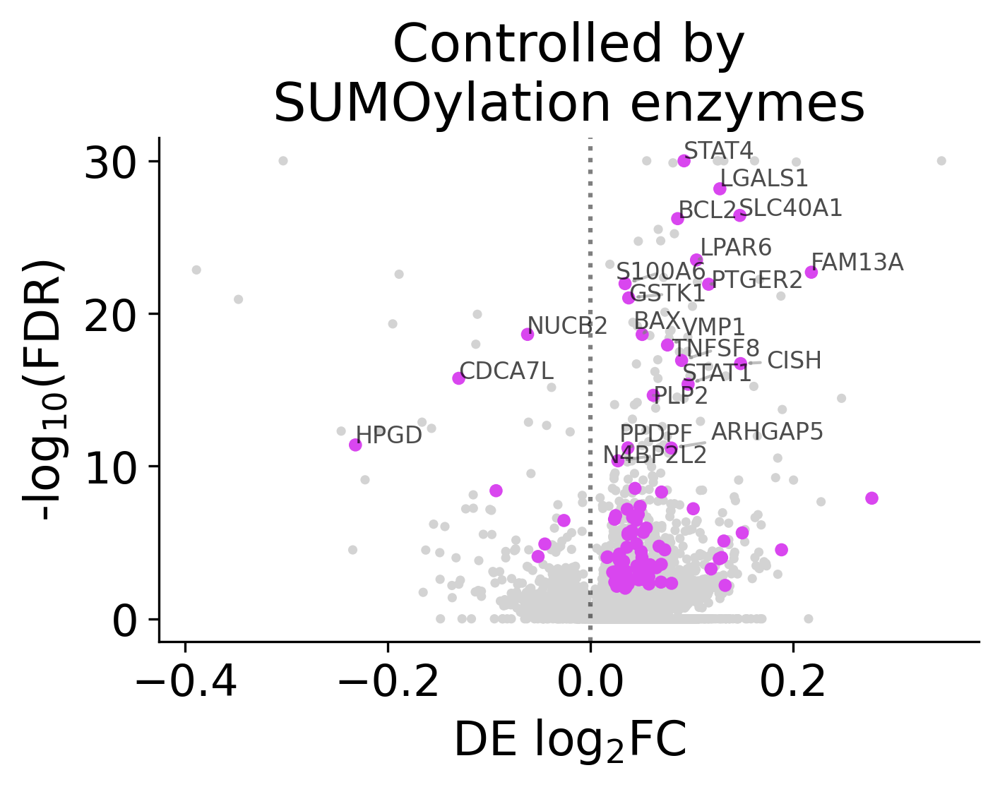

In [142]:
gr = ['UBE2I', 'UBA2'] 
group_gs = plot_regulator_effects_volcano(res_df, wide_de_results, wide_de_results_signif, 
    gr, f'Controlled by\nSUMOylation enzymes', 1, 
    text_labels=True, text_label_zscore_col = 'zscore_x_abs', log10_fdr_cap=30,
    color=palettes['pathways']['SUMO'],
    text_labels_thresh=7, return_genes=True);

plt.savefig('./results/volcano_downstream_SUMO.pdf', bbox_inches='tight')

bg_signature = signature_effect_size.gene_name.tolist()
controlled_signature = group_gs['gene']# [group_gs['zscore_y_sign'] == -1]

# Up-regulated enrichment
enr_up = gp.enrichr(
    gene_list=controlled_signature,
    gene_sets={**hallmark_gene_sets, **GO_sets},
    organism='human',
    outdir=None,
    background=bg_signature
)
enr_up.results.sort_values('Adjusted P-value')[0:10]

/tmp/ipykernel_200385/443268372.py:104: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
/tmp/ipykernel_200385/443268372.py:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), fontsize=12)
/tmp/ipykernel_200385/443268372.py:104: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
/tmp/ipykernel_200385/443268372.py:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), fontsize=12)
/tmp/ipykernel_200385/443268372.py:104: UserWarning: set_ticklabels() should only be used with a fixed n

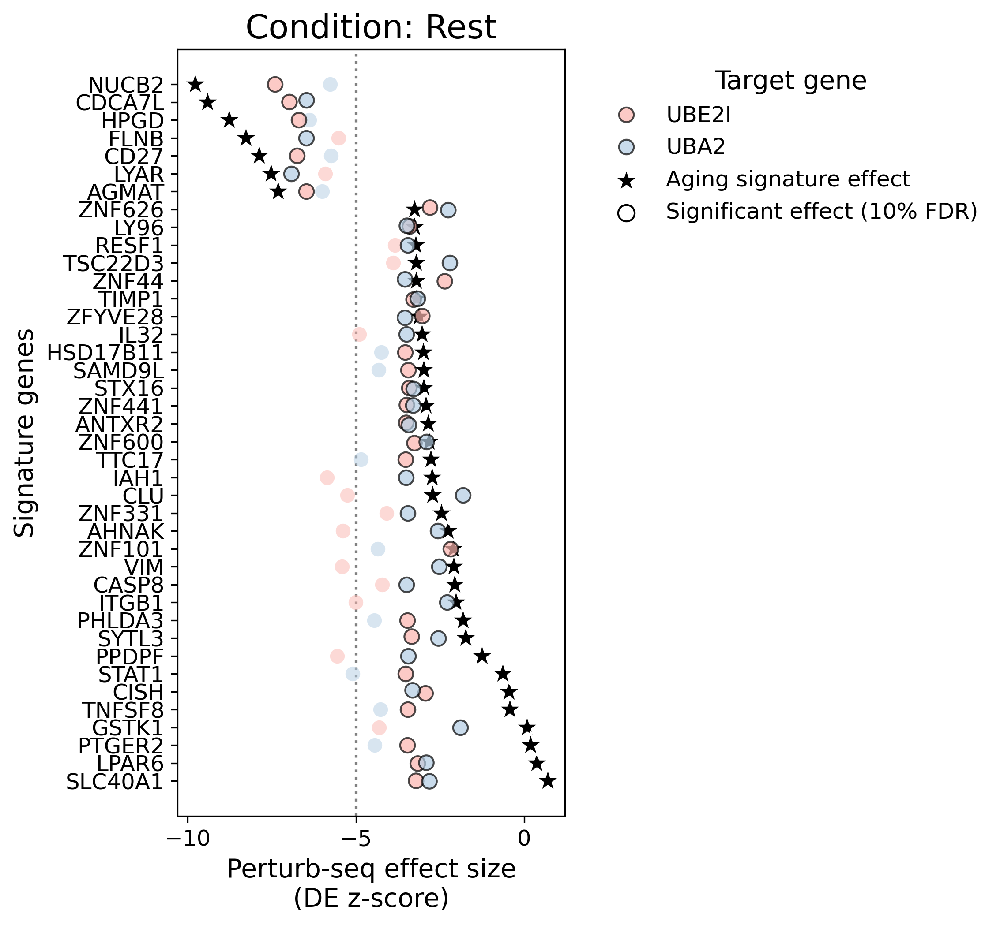

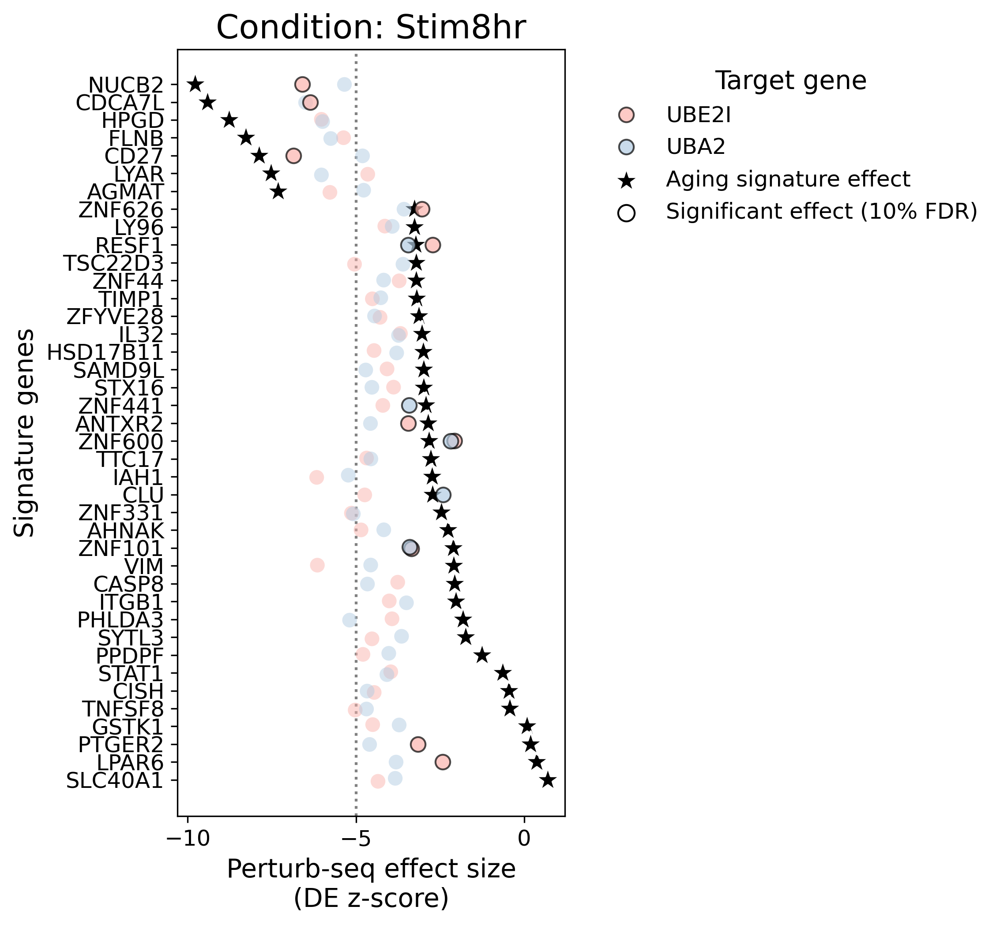

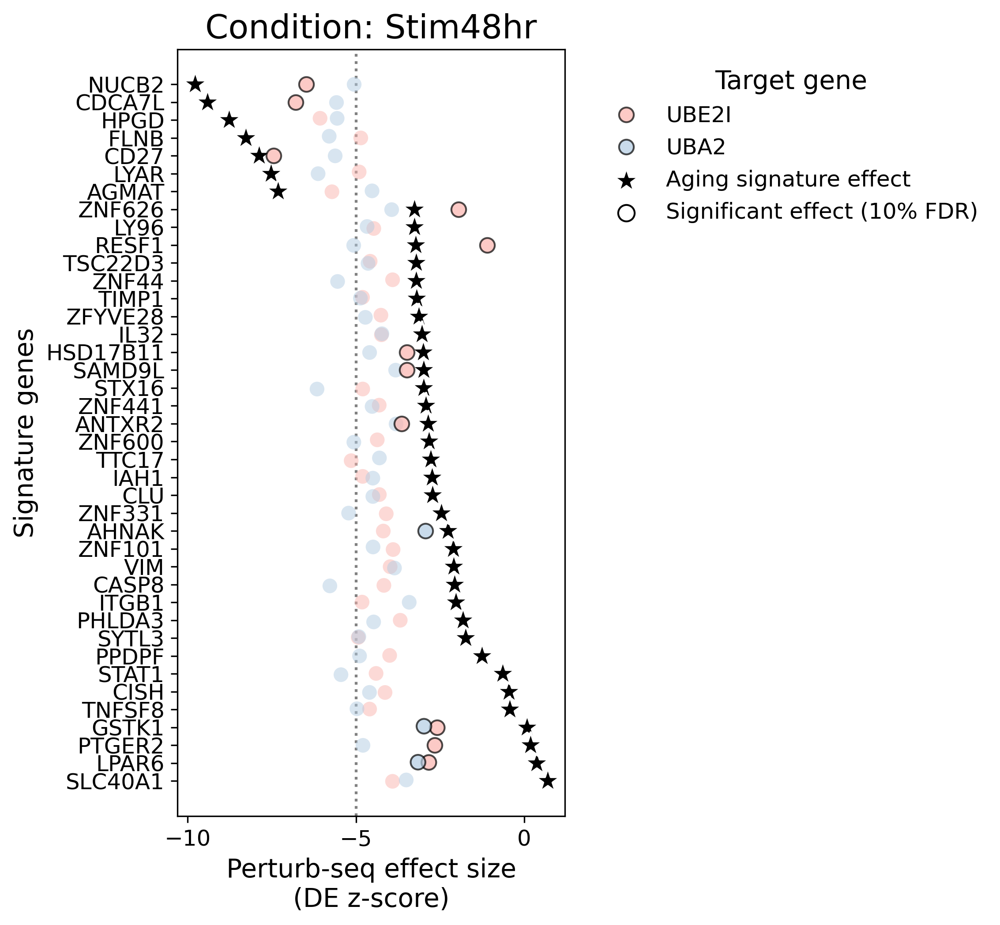

In [143]:
top_gs = group_gs.sort_values('zscore_y', ascending=False)[0:20]['gene'].to_list()
bot_gs = group_gs.sort_values('zscore_y', ascending=True)[0:20]['gene'].to_list()
pl_genes = top_gs + bot_gs 

for c in ['Rest', "Stim8hr", "Stim48hr"]:
    plot_regulator_effects(adata_de, pl_genes, gr, train_signatures['CD4T']['zscore'], figsize=(8,7), condition=c, sort_by='aging')
    plt.title(f'Condition: {c}')
    plt.savefig(f'./results/aging_regulators_effect_on_signature_SUMO.{c}.pdf')
    plt.savefig(f'./results/aging_regulators_effect_on_signature_SUMO.{c}.png')

/tmp/ipykernel_200385/2515018059.py:91: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin' will be ignored
  points = ax.scatter(


,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes
917,gs_ind_0,Regulation Of DNA-templated Transcription (GO:...,29/108,0.000061,0.076223,2.749364,26.682534,LBH;HDAC4;ZNF33A;NFKB1;PIM2;TIAL1;BHLHE40;SMAR...
418,gs_ind_0,Negative Regulation Of DNA-templated Transcrip...,18/58,0.000269,0.083907,3.220659,26.482342,BHLHE40;LBH;SMARCA2;CDKN1B;ARID5B;HDAC4;LYAR;H...
467,gs_ind_0,Negative Regulation Of Nucleic Acid-Templated ...,12/29,0.000149,0.083907,4.925416,43.401380,BHLHE40;LBH;SMARCA2;CDKN1B;ARID5B;EIF4A2;HDAC4...
1090,gs_ind_0,Regulation Of Transcription By RNA Polymerase ...,26/99,0.000239,0.083907,2.618432,21.831617,HDAC4;LYAR;NFKB1;SEM1;ANXA2;TIAL1;BHLHE40;SMAR...
480,gs_ind_0,Negative Regulation Of Programmed Cell Death (...,12/32,0.000450,0.112479,4.189930,32.289491,FCMR;XBP1;PIM1;FLNA;ANKLE2;BCL2;NFKB1;PIM2;IL2...
241,gs_ind_0,HALLMARK_E2F_TARGETS,7/13,0.000585,0.121872,7.747253,57.669956,CDKN1B;XPO1;LYAR;HMGB2;SRSF2;ATAD2;PTTG1
693,gs_ind_0,Positive Regulation Of Nucleic Acid-Templated ...,13/38,0.000728,0.129999,3.645868,26.342193,KAT2B;LBH;SMARCA2;IRF4;HDAC4;HMGB2;MDFIC;KMT2A...
536,gs_ind_0,Nucleocytoplasmic Transport (GO:0006913),4/5,0.001410,0.195853,19.800000,129.968479,CDKN1B;ATXN1;TPR;XPO1
921,gs_ind_0,Regulation Of Double-Strand Break Repair (GO:2...,4/5,0.001410,0.195853,19.800000,129.968479,BCL7A;SLF1;MRNIP;SMARCA2
888,gs_ind_0,Regulation Of Cell Population Proliferation (G...,14/47,0.002138,0.267307,2.976850,18.300694,KAT2B;CDK6;DPP4;SMARCA2;XBP1;CDKN1B;FLT3LG;HDA...


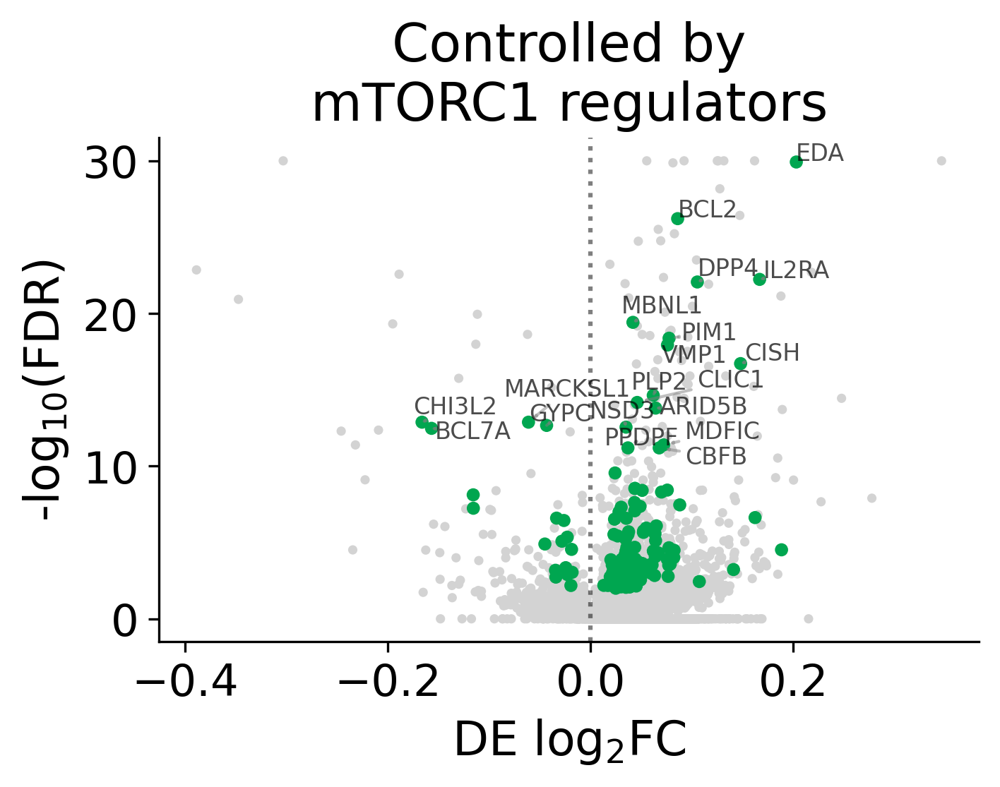

In [144]:
gr = ['DEPDC5', 'TSC1','TSC2', 'NPRL3']
group_gs = plot_regulator_effects_volcano(res_df, wide_de_results, wide_de_results_signif, 
    gr, f'Controlled by\nmTORC1 regulators', -1, 
    text_labels=True, text_label_zscore_col = 'zscore_x_abs', log10_fdr_cap=30,
    color=palettes['pathways']['mTORC1'],
    text_labels_thresh=7, return_genes=True);

plt.savefig('./results/volcano_downstream_mTORC1.pdf', bbox_inches='tight')

bg_signature = signature_effect_size.gene_name.tolist()
controlled_signature = group_gs['gene']# [group_gs['zscore_y_sign'] == -1]

# Up-regulated enrichment
enr_up = gp.enrichr(
    gene_list=controlled_signature,
    gene_sets={**hallmark_gene_sets, **GO_sets},
    organism='human',
    outdir=None,
    background=bg_signature
)
enr_up.results.sort_values('Adjusted P-value')[0:10]


/tmp/ipykernel_200385/443268372.py:104: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
/tmp/ipykernel_200385/443268372.py:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), fontsize=12)
/tmp/ipykernel_200385/443268372.py:104: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
/tmp/ipykernel_200385/443268372.py:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), fontsize=12)
/tmp/ipykernel_200385/443268372.py:104: UserWarning: set_ticklabels() should only be used with a fixed n

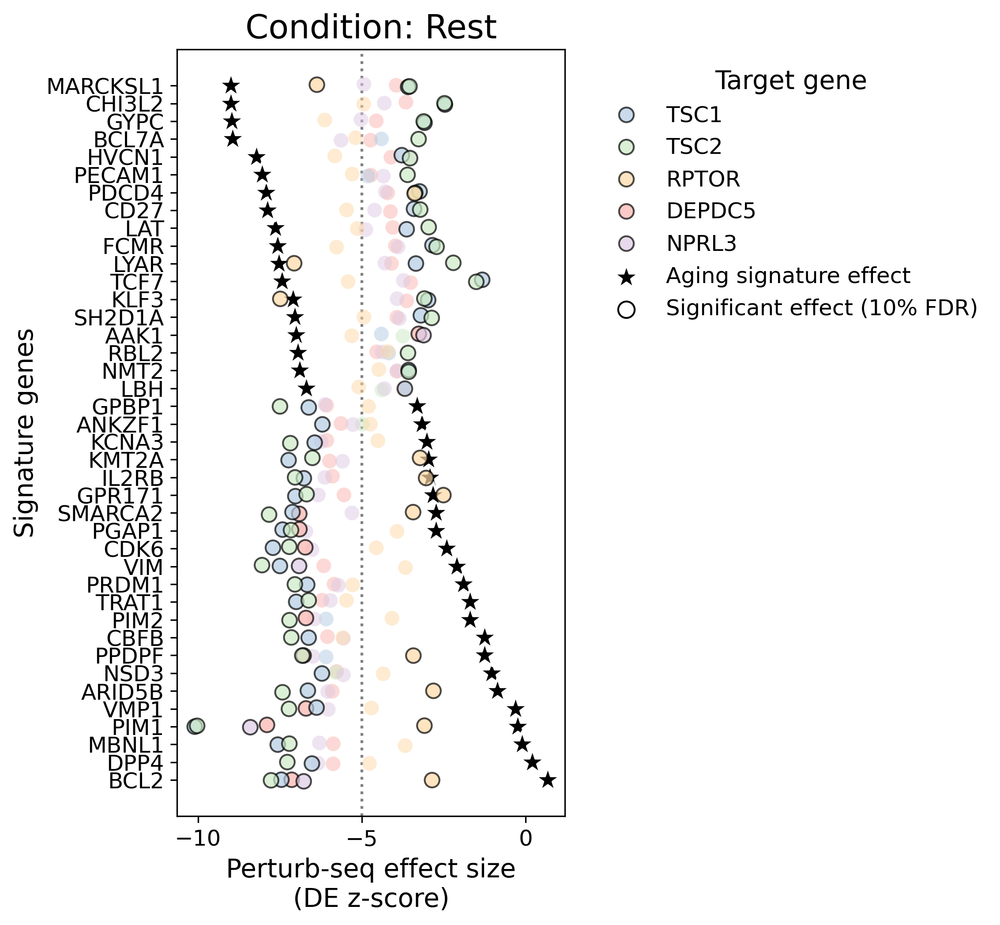

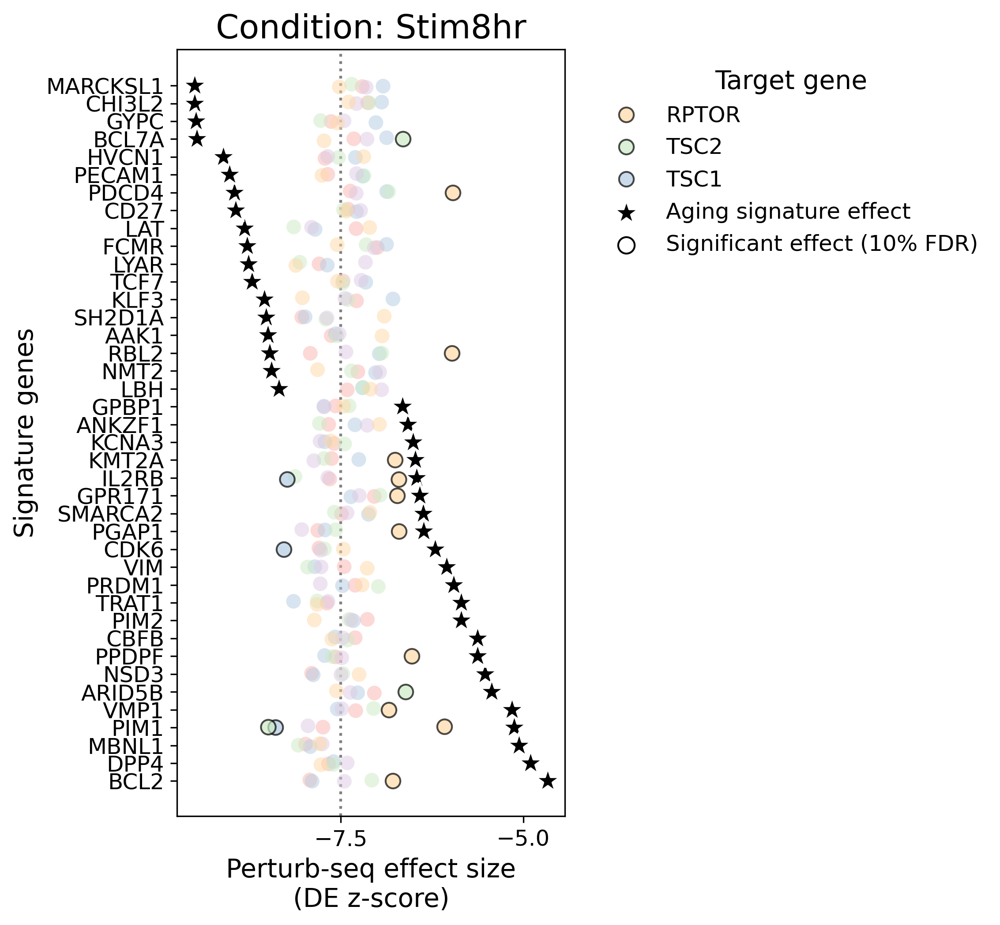

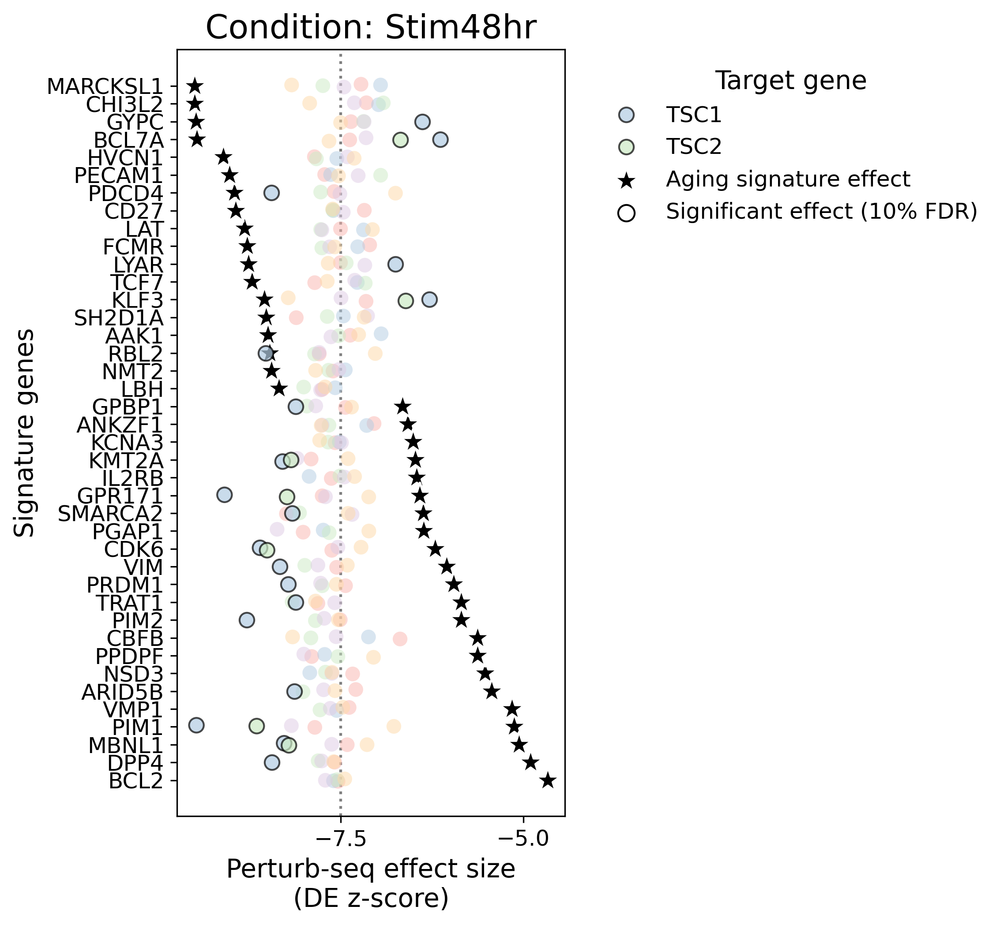

In [145]:

top_gs = group_gs.sort_values('zscore_y', ascending=False)[0:20]['gene'].to_list()
bot_gs = group_gs.sort_values('zscore_y', ascending=True)[0:20]['gene'].to_list()
pl_genes = top_gs + bot_gs 

for c in ['Rest', "Stim8hr", "Stim48hr"]:
    plot_regulator_effects(adata_de, pl_genes, gr + ['RPTOR'], train_signatures['CD4T']['zscore'], figsize=(8,7), condition=c, sort_by='aging')
    plt.title(f'Condition: {c}')
    plt.savefig(f'./results/aging_regulators_effect_on_signature_mTORC1.{c}.pdf')
    plt.savefig(f'./results/aging_regulators_effect_on_signature_mTORC1.{c}.png')

In [352]:

# apoptosis_gs = enr_up.results[enr_up.results['Term'] == 'HALLMARK_APOPTOSIS'].Genes.str.split(";").iloc[0]
# emt_gs = enr_up.results[enr_up.results['Term'] == 'HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION'].Genes.str.split(";").iloc[0]
# JAK_STAT_gs = enr_up.results[enr_up.results['Term'] == 'Receptor Signaling Pathway Via STAT (GO:0097696)'].Genes.str.split(";").iloc[0]


# group_gs = plot_regulator_effects_volcano(res_df, wide_de_results, wide_de_results_signif, 
#     ['UBE2I', 'UBA2'], f'Controlled by SUMO pathway', 1, 
#     text_labels=JAK_STAT_gs + apoptosis_gs + emt_gs,
#     text_labels_thresh=5, return_genes=True, log10_fdr_cap=30);



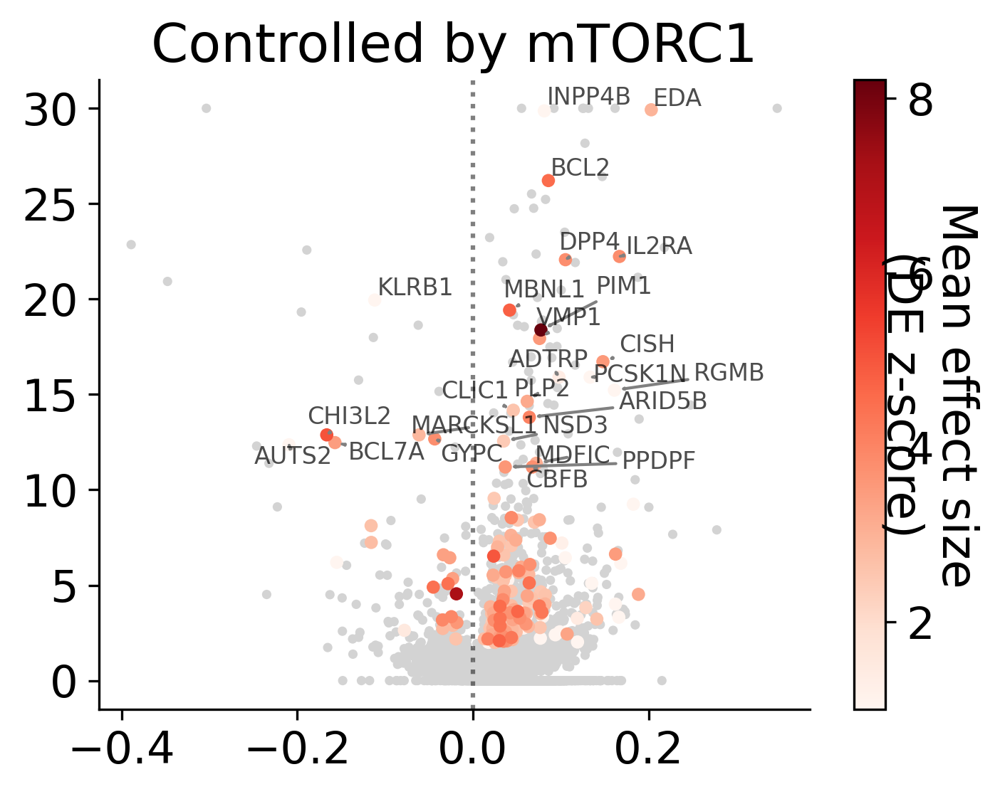

In [354]:
group_gs = plot_regulator_effects_volcano(res_df, wide_de_results, wide_de_results_signif, 
    ['DEPDC5', 'TSC1','TSC2', 'NPRL3'], f'Controlled by mTORC1', -1, 
    text_labels=True, text_label_zscore_col = 'zscore_x_abs', log10_fdr_cap=30,
    text_labels_thresh=7, return_genes=True);

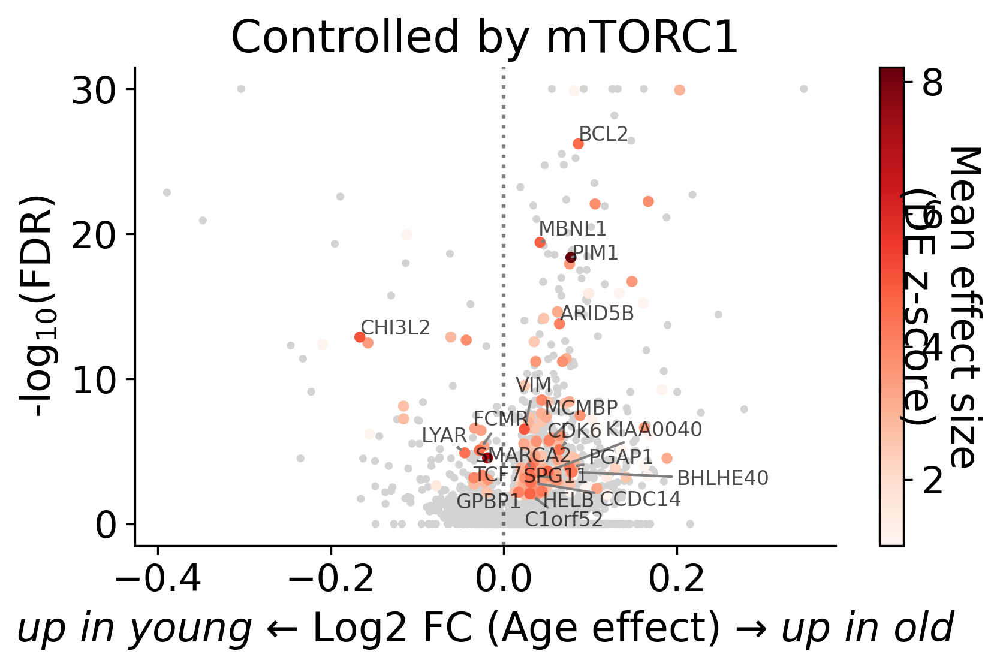

In [344]:
fig, ax = plt.subplots(figsize=(6, 4))

# 'mTORC1 inibitors',[['DEPDC5', 'TSC1','TSC2', 'NPRL3', 'RPTOR'], -1
mTORC1_gs = plot_regulator_effects_volcano(res_df, wide_de_results, wide_de_results_signif, 
    ['DEPDC5', 'TSC1','TSC2', 'NPRL3'], f'Controlled by mTORC1', -1, text_labels=True, text_labels_thresh=4, ax=ax, return_genes=True, log10_fdr_cap=30);
plt.xlabel(r'$\it{up\ in\ young}$ ← Log2 FC (Age effect) → $\it{up\ in\ old}$', fontsize=16)
ax.set_ylabel('-log$_{10}$(FDR)', fontsize=ax.xaxis.label.get_size())
plt.tight_layout()
plt.savefig('./results/volcano_downstream_mTORC1.pdf', bbox_inches='tight')

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes
921,gs_ind_0,Regulation Of DNA-templated Transcription (GO:...,29/108,0.000071,0.088790,2.720604,25.999096,TIAL1;CBFB;HDAC4;XBP1;PIM2;ZNF33A;HMGB2;NFKB1;...
469,gs_ind_0,Negative Regulation Of Nucleic Acid-Templated ...,12/29,0.000160,0.092902,4.880478,42.643958,MDFIC;HDAC4;LBH;EIF4A2;BCL7A;ARID5B;HMGB2;SMAR...
1095,gs_ind_0,Regulation Of Transcription By RNA Polymerase ...,26/99,0.000272,0.092902,2.591715,21.274739,TIAL1;CBFB;HDAC4;XBP1;HMGB2;NFKB1;BHLHE40;PRDM...
418,gs_ind_0,Negative Regulation Of DNA-templated Transcrip...,18/58,0.000296,0.092902,3.189886,25.917207,MDFIC;CBFB;HDAC4;LBH;TPR;BCL7A;FLNA;ARID5B;HMG...
482,gs_ind_0,Negative Regulation Of Programmed Cell Death (...,12/32,0.000483,0.121238,4.151686,31.700012,XBP1;PIM2;FLNA;ANKLE2;NFKB1;IL2RB;CD27;BCL2;FC...
241,gs_ind_0,HALLMARK_E2F_TARGETS,7/13,0.000613,0.128197,7.679045,56.804315,ATAD2;HMGB2;SRSF2;XPO1;PTTG1;CDKN1B;LYAR
697,gs_ind_0,Positive Regulation Of Nucleic Acid-Templated ...,13/38,0.000784,0.140499,3.612332,25.833720,MDFIC;HDAC4;LBH;ATAD2;PIM2;IRF4;HMGB2;NFKB1;SM...
925,gs_ind_0,Regulation Of Double-Strand Break Repair (GO:2...,4/5,0.001451,0.202371,19.629213,128.283205,SLF1;BCL7A;MRNIP;SMARCA2
540,gs_ind_0,Nucleocytoplasmic Transport (GO:0006913),4/5,0.001451,0.202371,19.629213,128.283205,ATXN1;XPO1;TPR;CDKN1B
679,gs_ind_0,Positive Regulation Of Lymphocyte Differentiat...,3/3,0.002441,0.278536,45.513011,273.770104,XBP1;CD27;SMARCA2


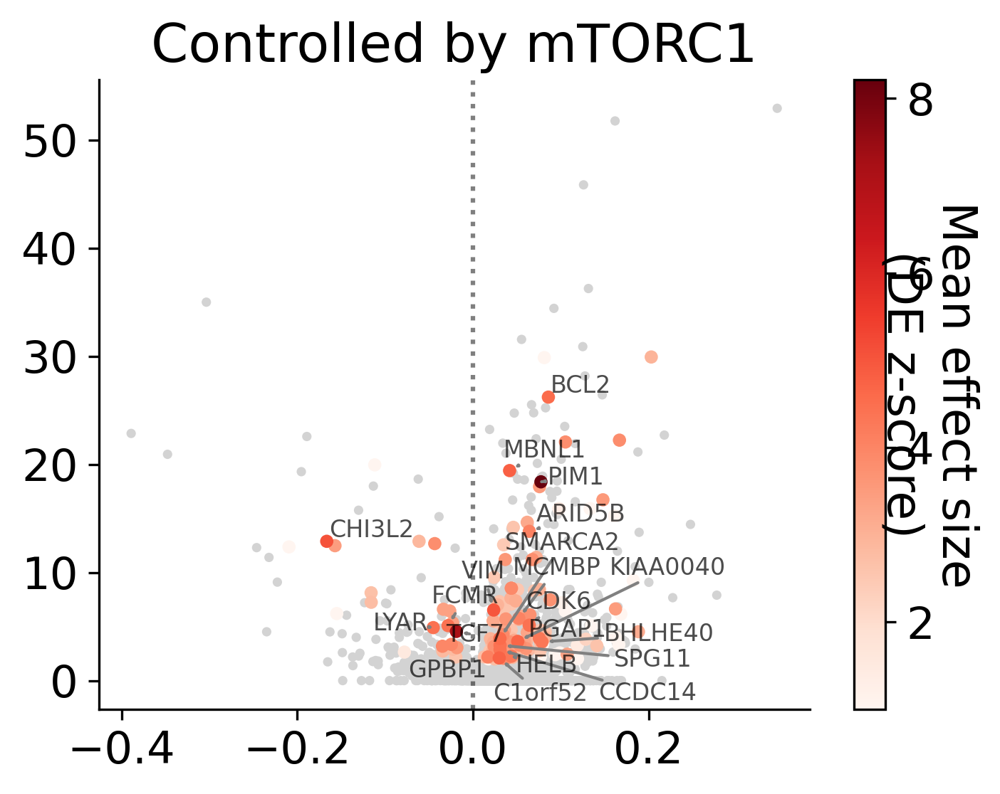

In [338]:
group_gs = plot_regulator_effects_volcano(res_df, wide_de_results, wide_de_results_signif, 
    ['DEPDC5', 'TSC1','TSC2', 'NPRL3'], f'Controlled by mTORC1', -1, 
    text_labels=True,
    text_labels_thresh=4, return_genes=True);

bg_signature = signature_effect_size.gene_name.tolist()
controlled_signature = group_gs['gene'][group_gs['zscore_y_abs'] > 2]

# Up-regulated enrichment
enr_up = gp.enrichr(
    gene_list=controlled_signature,
    gene_sets={**hallmark_gene_sets, **GO_sets},
    organism='human',
    outdir=None,
    background=bg_signature
)
enr_up.results.sort_values('Adjusted P-value')[0:10]

In [217]:
controlled_by_mtorc1 = mTORC1_gs['gene'].tolist()
# controlled_by_mtorc1 = mTORC1_gs[mTORC1_gs['zscore_x'].abs() > 3].gene.tolist()

In [218]:
dataset_key = 'CD4T_Rest'
model, X, y_train = comparison_results[dataset_key]

/tmp/ipykernel_665418/443268372.py:104: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
/tmp/ipykernel_665418/443268372.py:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), fontsize=12)


Text(0.5, 1.0, 'Aging signature genes controlled by mTORC1 regulators')

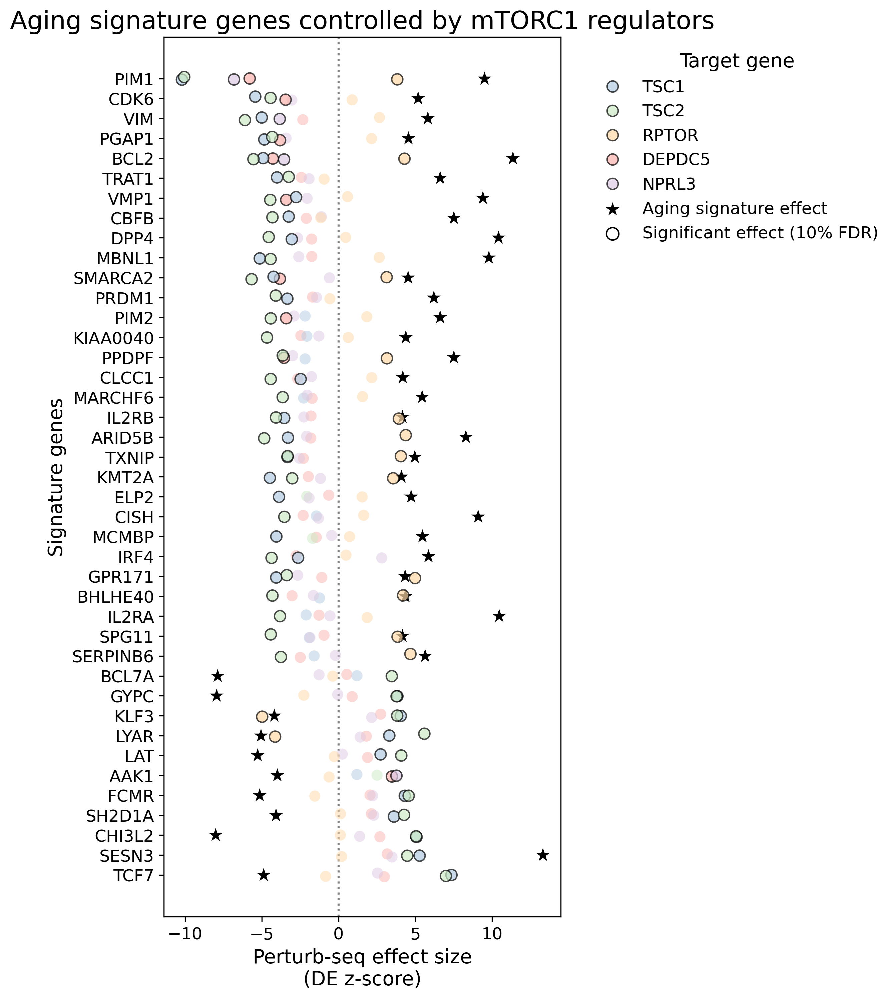

In [219]:
top_gs = mTORC1_gs[np.abs(mTORC1_gs.zscore_x) > 4].sort_values('zscore_y', ascending=False)[0:10]['gene'].to_list()
bot_gs = mTORC1_gs[np.abs(mTORC1_gs.zscore_x) > 4].sort_values('zscore_y', ascending=True)[0:30]['gene'].to_list()
pl_genes = top_gs + bot_gs + ['SESN3']

# pl_genes = [
#     'PPDPF',  'CISH', 'MDFIC', 'PIM1', 'DPP4', 'TRAT1', 'UBQLN2', 'ARID5B', 'CLIC1', 'PLP2', 'BCL2', 'PIM2', # down
#     'TCF7','KLF3', 'GYPC', # up
#     ]

# np.setdiff1d(pl_genes, controlled_by_mtorc1)
gr = ['DEPDC5', 'TSC1','TSC2', 'NPRL3', 'RPTOR']
# gr = ['RPTOR']
plot_regulator_effects(adata_de, pl_genes, gr, train_signatures['CD4T']['zscore'], figsize=(9,10), condition='Rest')

# plot_regulator_effects(adata_de, pl_genes, gr, train_signatures['CD4T']['zscore'], figsize=(9,15), condition='Rest', sort_by='aging')
plt.title('Aging signature genes controlled by mTORC1 regulators')
# plt.savefig('./results/aging_regulators_effect_on_signature.pdf')
# plt.savefig('./results/aging_regulators_effect_on_signature.png')

/tmp/ipykernel_665418/443268372.py:104: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
/tmp/ipykernel_665418/443268372.py:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), fontsize=12)


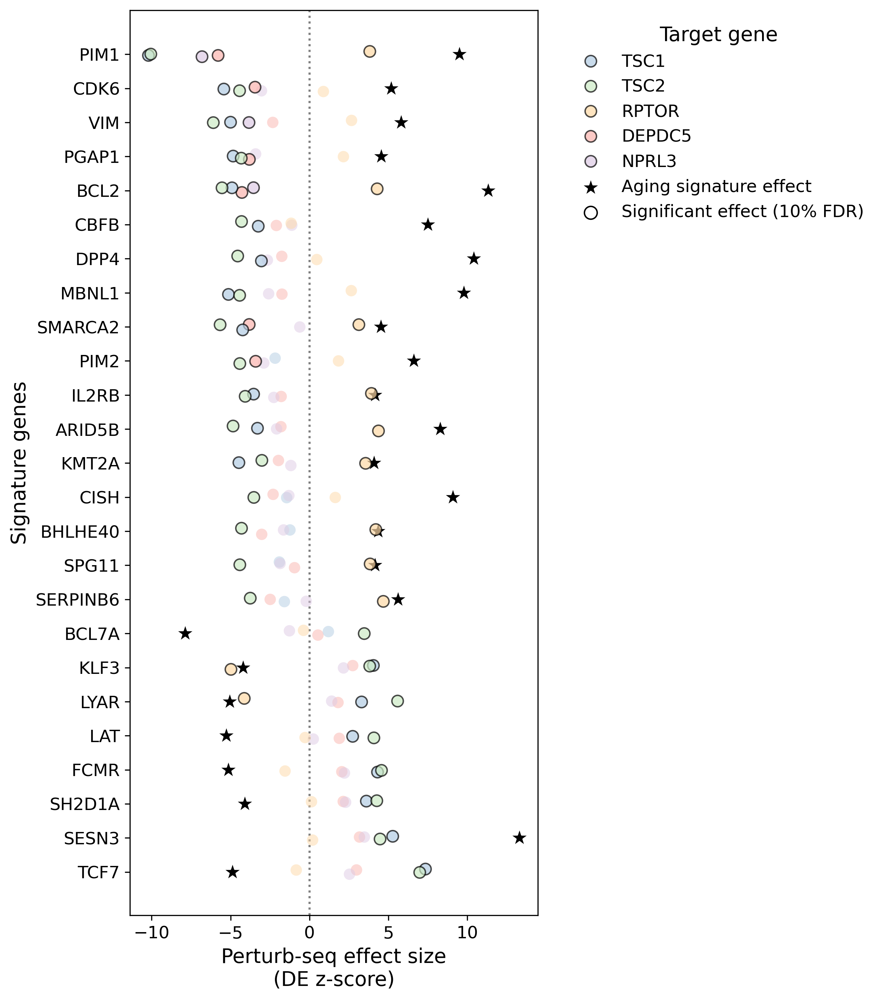

In [220]:
pl_genes = [
    'TCF7',
#  'CHI3L2', # does not replicate in replication cohort
 'LYAR',
 'FCMR',
 'SH2D1A',
 'KLF3',
#  'GYPC', # might be ery artifact
#  'AAK1', # does not replicate in replication cohort
 'BCL7A',
 'LAT',
 'PIM1',
 'VIM',
 'MBNL1',
 'SMARCA2',
 'BCL2',
 'CDK6',
 'SPG11',
 'PGAP1',
 'BHLHE40',
 'ARID5B',
 'PIM2',
 'IL2RB',
 'DPP4',
 'CBFB',
 'SERPINB6',
 'KMT2A',
 'SESN3',
 'CISH'
 ]


gr = ['DEPDC5', 'TSC1','TSC2', 'NPRL3', 'RPTOR']
plot_regulator_effects(adata_de, pl_genes, gr, train_signatures['CD4T']['zscore'], figsize=(9,10), condition='Rest')

# Save pl_genes to a text file, one gene per line
with open('./results/mtorc1_controlled_genes.txt', 'w') as f:
    for gene in pl_genes:
        f.write(gene + '\n')


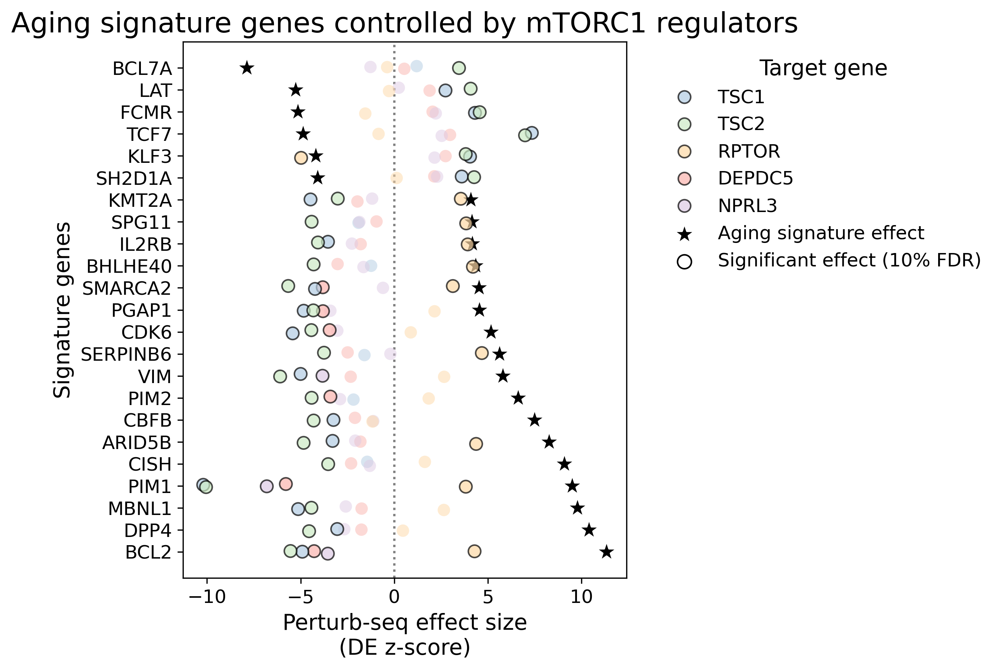

In [25]:
## See functional_category_summary_table.md
func_categories_pl_genes = {
    'Resistance to apoptosis': ['BCL2', 'PIM1', 'PIM2', 'ARID5B', 'SERPINB6'],
    'Mitochondrial dysfunction': ['CISH'],
    'T activation/survival':['TCF7', 'BCL2', 'CDK6', 'IL2RB', 'VIM', 'CBFB', 'PIM1', 'PIM2', 'LAT', 'DPP4', 'KLF3', 'SH2D1A', 'KMT2A'],
    'Teff differentiation':['TCF7', 'BHLHE40', 'VIM', 'SH2D1A'],
    'BAF chromatin remodelling':['SMARCA2', 'BCL7A'],
    'Autophagy':['SPG11']
}

pl_genes_ordered = [
 'ARID5B', 'SERPINB6',
 'BCL2', 'PIM1', 'PIM2', 
    'CDK6', 'IL2RB', 'DPP4', 'KMT2A','CBFB','LAT','KLF3',
    'SH2D1A', 'TCF7',  'VIM',
    'BHLHE40',
    'CISH',
    'SPG11',
    'SMARCA2', 'BCL7A', 
    'FCMR', 'MBNL1', 'PGAP1'
 ]

plot_regulator_effects(adata_de, pl_genes_ordered, gr, train_signatures['CD4T']['zscore'], figsize=(9,6), condition='Rest', sort_by='aging')
plt.title('Aging signature genes controlled by mTORC1 regulators')
plt.savefig('./results/aging_regulators_effect_on_signature.pdf')
plt.savefig('./results/aging_regulators_effect_on_signature.png')



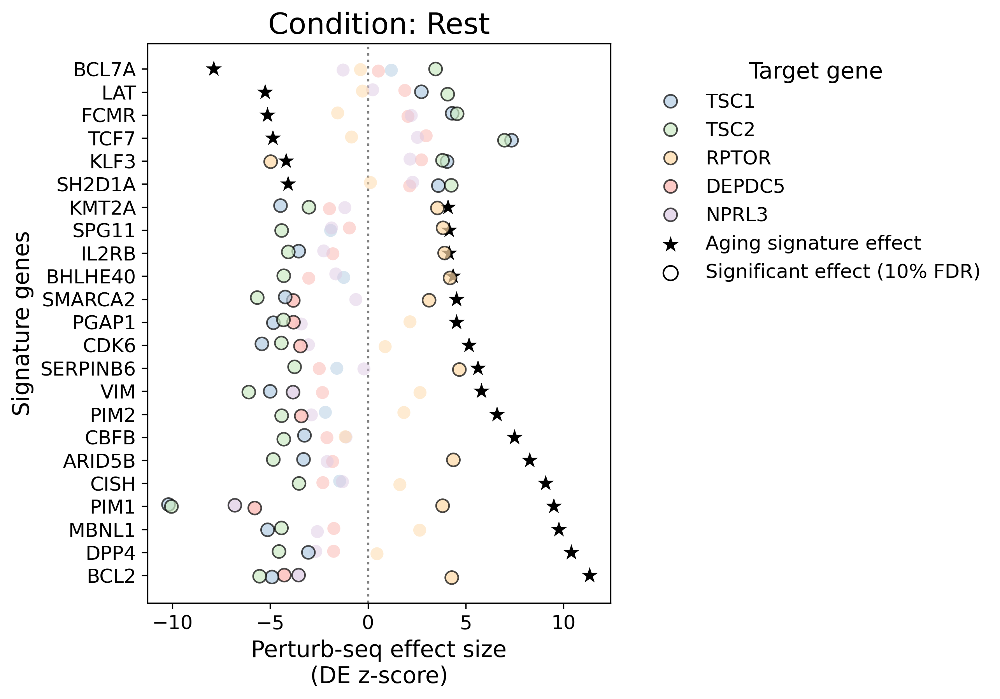

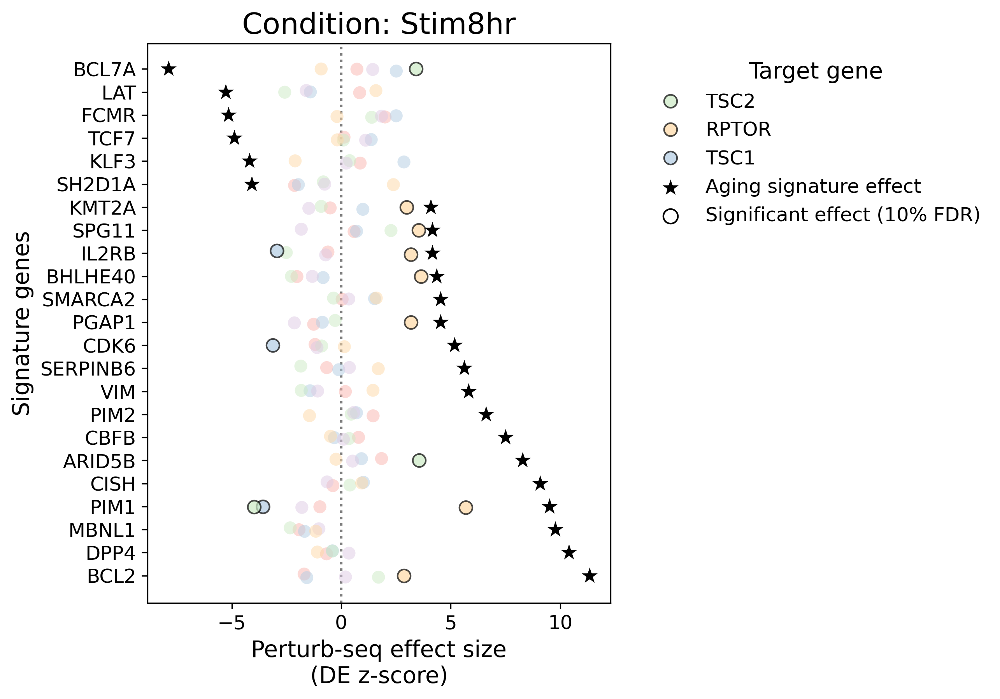

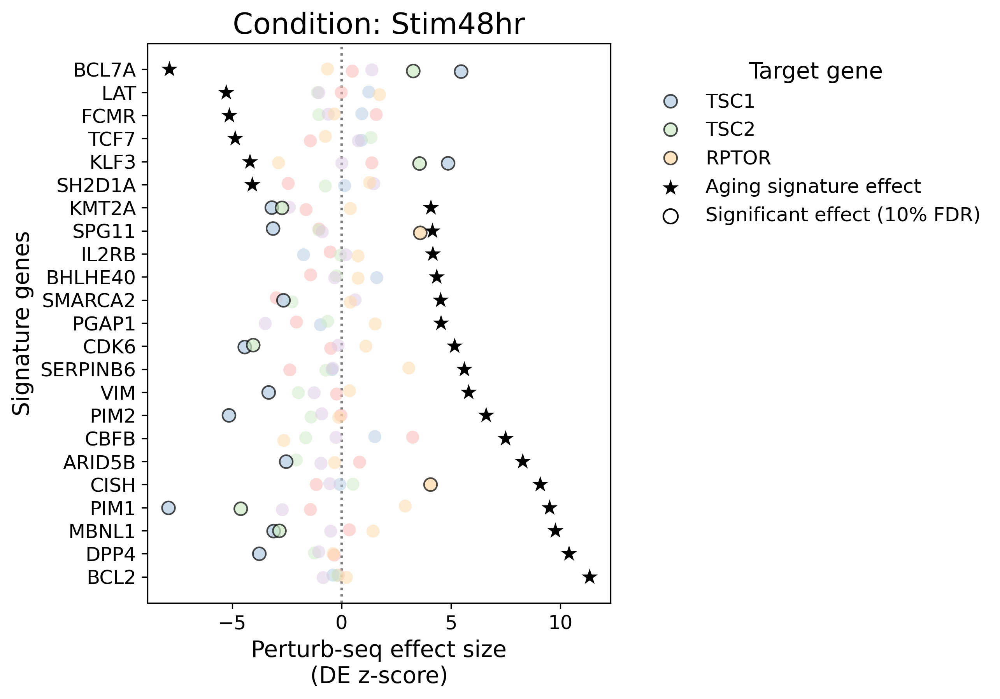

In [27]:
plot_regulator_effects(adata_de, pl_genes_ordered, gr, train_signatures['CD4T']['zscore'], figsize=(9,6), condition='Rest', sort_by='aging')
plt.title('Condition: Rest')
plt.savefig('./results/aging_regulators_effect_on_signature.Rest.pdf')
plt.savefig('./results/aging_regulators_effect_on_signature.Rest.png')
plot_regulator_effects(adata_de, pl_genes_ordered, gr, train_signatures['CD4T']['zscore'], figsize=(9,6), condition='Stim8hr', sort_by='aging')
plt.title('Condition: Stim8hr')
plt.savefig('./results/aging_regulators_effect_on_signature.Stim8hr.pdf')
plt.savefig('./results/aging_regulators_effect_on_signature.Stim8hr.png')
plot_regulator_effects(adata_de, pl_genes_ordered, gr, train_signatures['CD4T']['zscore'], figsize=(9,6), condition='Stim48hr', sort_by='aging')
plt.title('Condition: Stim48hr')
plt.savefig('./results/aging_regulators_effect_on_signature.Stim48hr.pdf')
plt.savefig('./results/aging_regulators_effect_on_signature.Stim48hr.png')


### Regulators of the most DE genes

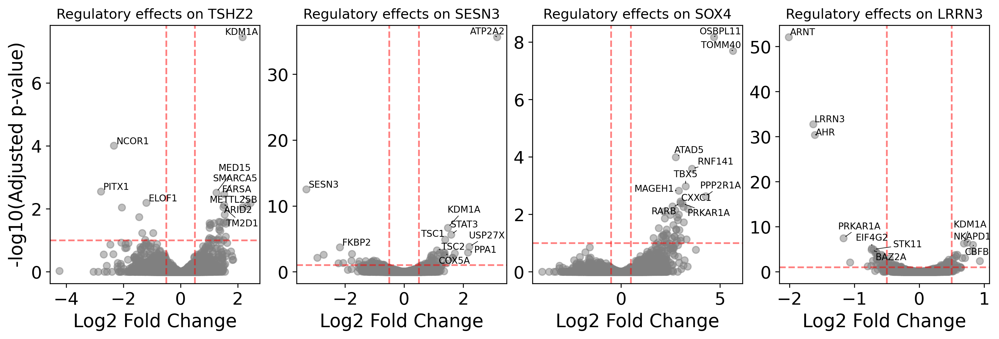

In [76]:
import matplotlib.pyplot as plt
from adjustText import adjust_text

genes_to_plot = ['TSHZ2', 'SESN3', 'SOX4', 'LRRN3']
n_genes = len(genes_to_plot)
fig, axes = plt.subplots(
    1, n_genes, 
    figsize=(6*n_genes//2, 4), 
    # gridspec_kw={'width_ratios': [1]*n_genes + [1.3]}, 
    constrained_layout=True
)

if n_genes == 1:
    axes = [axes]  # easier indexing if just 1

for idx, g in enumerate(genes_to_plot):
    ax = axes[idx]
    marker_effects = get_DE_results_long(adata_de, genes=[g])
    marker_effects = marker_effects[marker_effects['culture_condition'] == 'Rest']
    scatter = ax.scatter(marker_effects['log_fc'], -np.log10(marker_effects['adj_p_value']), alpha=0.5, color='grey', rasterized=True)
    ax.axhline(-np.log10(0.1), color='red', linestyle='--', alpha=0.5)
    ax.axvline(-0.5, color='red', linestyle='--', alpha=0.5)
    ax.axvline(0.5, color='red', linestyle='--', alpha=0.5)

    sig_points = marker_effects.nsmallest(10, 'adj_p_value')
    texts = []
    for _, row in sig_points.iterrows():
        texts.append(ax.text(row['log_fc'], -np.log10(row['adj_p_value']), 
                                row['target_contrast_gene_name'], fontsize=8))
    adjust_text(texts, arrowprops=dict(arrowstyle='->', color='black', lw=0.5), ax=ax)

    ax.set_xlabel('Log2 Fold Change')
    if idx == 0:
        ax.set_ylabel('-log10(Adjusted p-value)')
    else:
        ax.set_ylabel('')
    ax.set_title(f'Regulatory effects on {g}', fontsize=12)

# plt.show()

# top_DE_genes = train_signatures['CD4T'].sort_values('adj_p_value')[0:20].index
# top_DE_genes = top_DE_genes[top_DE_genes.isin(adata_de.var_names)].tolist()
# plot_regulator_effects(adata_de, top_DE_genes, gr, train_signatures['CD4T']['zscore'], figsize=(9,6), condition='Rest', sort_by='aging', ax=axes[-1]);
# plt.ylabel('Top aging signature genes (ranked by FDR)')
# plt.tight_layout()
plt.savefig('./results/topDE_genes_suppl.pdf')